In [1]:
import random
import numpy as np
import pandas as pd
from numpy.linalg import norm
from collections import Counter

from sklearn.preprocessing import MinMaxScaler
from scipy.stats import rankdata
import scipy.stats as ss

from gensim.models.doc2vec import Doc2Vec
from mofgraph2vec.featurize.mof2doc import MOF2doc

from sklearn.manifold import TSNE
import umap
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import matplotlib as mpl
import matplotlib.pyplot as plt
from adjustText import adjust_text
import matplotlib.lines as mlines
mpl.rcParams["font.size"] = 18

/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/l

In [2]:
def cosine(A, B):
    return np.dot(A,B)/(norm(A)*norm(B))

In [3]:
CORPUS_CONFIG = {
  "embed_label": True,
  "label_path": "../data/arc-core-xq.csv",
  "descriptors_to_embed": ["Di", "Df", "Dif", "info.density"],
  "category_to_embed": ["Crystalnet"],
  "tags_to_embed": [], 
  "id_column": "info.name",
  "wl_step": 2,
  "n_components": 2,
  "use_hash": False,
  "writing_style": "paragraph",
  "composition": False,
  "mode": "all",
  "embed_cif": False
}

In [4]:
ARC_MODEL_PATH = "../experiments/workflow/wandb/offline-run-20231025_093835-53o0269a/tmp/embedding_model.pt"
ARC_CORE_MODEL_PATH = "../experiments/workflow/wandb/offline-run-20231031_084625-6c2hprja/tmp/embedding_model.pt"

In [5]:
ARC_CIF = ["../data/cifs/arc/"]
CORE_CIF = ["../data/cifs/core_md/"]
ARC_CORE_CIF = ["../data/cifs/arc/", "../data/cifs/core_md/"]

In [6]:
ARC_ID = "info.name"

In [7]:
def load_vector(test_cif_path, model):
    corpus = {}
    documents = {}
    test_ds = MOF2doc(cif_path=test_cif_path, **CORPUS_CONFIG).get_documents()
    for dp in test_ds:
        documents.update(
            {dp.tags[0]: dp.words}
        )
        corpus.update(
            {dp.tags[0]: model.dv[dp.tags[0]]}
        )
    return documents, corpus

In [8]:
arc_model = Doc2Vec.load(ARC_MODEL_PATH)
arc_core_model = Doc2Vec.load(ARC_CORE_MODEL_PATH)

In [9]:
df = pd.read_csv("../data/arc-merge-xq-1101.csv")

In [10]:
def topn(mofs, targets, ntop):
    combined_lists = list(zip(mofs, targets))
    sorted_combined_lists = sorted(combined_lists, key=lambda x: x[1], reverse=True)
    top = [item[0] for item in sorted_combined_lists[:ntop]]
    return top

# Projection

In [11]:
all_mofs = arc_model.dv.index_to_key
all_emb = np.array([arc_model.dv[x] for x in all_mofs])

In [12]:
projector = TSNE(n_components=2, perplexity=30)
emb_2d = projector.fit_transform(all_emb)

In [13]:
len(all_mofs), emb_2d.shape

(22035, (22035, 2))

# Global functions

In [14]:
def target_mapping(data, id_name, targets, mofs):
    values = []
    for tar in targets:
        val = np.array([data[data[id_name] == m][tar].values[0] for m in mofs])
        values.append(val)
    return values

In [15]:
def batch_recommendation(model, tops, data, id_name, targets, no_top):
    ratio = 1.0
    while True:
        no_recm = int(no_top / (len(tops) * ratio))
        print("Current ratio:", ratio)
        recommendations = []
        cosines = []
        i = 0
        while len(recommendations) < no_top and i < len(tops):
            t = tops[i]
            recm = model.dv.most_similar(t, topn=no_recm)
            recm_names = [x[0] for x in recm]
            recommendations += recm_names
            recommendations = np.unique(recommendations).tolist()
            for r in recommendations:
                vec_t = model.dv[t]
                vec_r = model.dv[r]
                cos = cosine(vec_t, vec_r)
                cosines.append(cos)
            i += 1
        
        if len(recommendations) >= no_top:
            break
        else:
            ratio *= 0.9  # You can adjust the multiplier based on your specific scenario
    
    recommendations = recommendations[:no_top]
    cosines = cosines[:no_top]
    
    target_values = target_mapping(data, id_name, targets, recommendations)
    assert len(recommendations) == no_top
    return recommendations, target_values, cosines

In [16]:
def top_rank(mofs, targets, ntop):
    ranks = [rankdata(tar) for tar in targets]
    sum_ranks = np.sum(np.array(ranks), axis=0)
    combined_lists = list(zip(mofs, sum_ranks))
    sorted_combined_lists = sorted(combined_lists, key=lambda x: x[1], reverse=True)
    top = [item[0] for item in sorted_combined_lists[:ntop]]
    return top

# Section 1. Recommendation for similar structures

## Case 1. Methane storage

### Target 1. kH 

#### 1. Initialization

In [114]:
mof1 = np.array(random.choices(df["info.name"].values, k=100))
target1 = np.array([df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in mof1])

In [115]:
explored_mofs = mof1
explored_targets = np.array([df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in explored_mofs])

In [116]:
top1 = topn(mof1, target1, 10)

#### 2. 1st round

In [117]:
mof2 = []
for c in top1:
    recm = arc_model.dv.most_similar(c, topn=15)
    recm_names = [x[0] for x in recm]
    mof2 += recm_names
mof2 = np.unique(mof2).astype(str)
target2 = np.array([df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in mof2])
mof2 = topn(mof2, target2, 100)
target2 = np.array([df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in mof2])

In [118]:
explored_mofs = np.unique(np.concatenate((mof1, mof2)))
explored_targets = np.array([df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in explored_mofs])

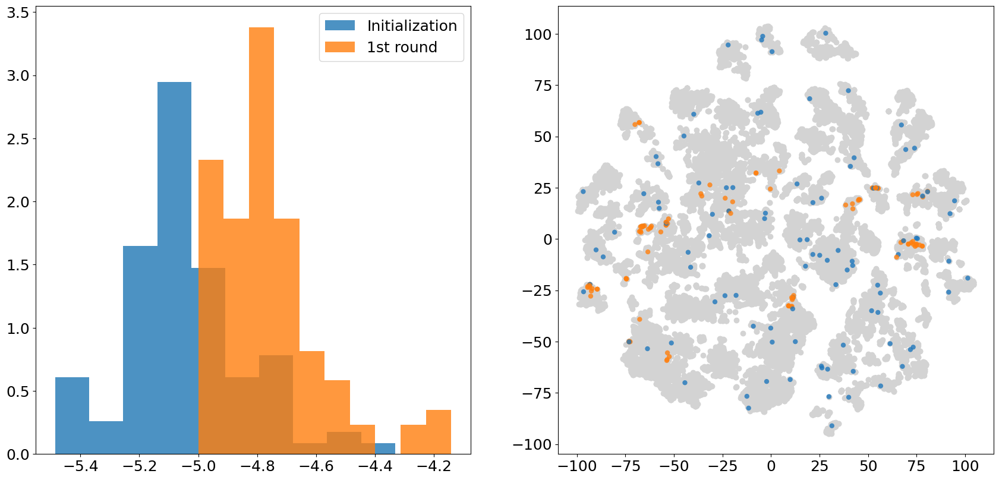

In [119]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20.8, 9.8)
ax[0].hist(target1, bins=10, density=True, alpha=.8, label="Initialization")
ax[0].hist(target2, bins=10, density=True, alpha=.8, label="1st round")

ax[1].scatter(emb_2d[:, 0], emb_2d[:, 1], color='lightgrey')
for i, name in enumerate(all_mofs):
    if name in mof1:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.8, ec=None)      
    if name in mof2:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)


ax[0].legend()

#### 3. 2nd round

In [120]:
top2 = topn(explored_mofs, explored_targets, 10)

In [121]:
mof3 = []
for c in top2:
    recm = arc_model.dv.most_similar(c, topn=25)
    recm_names = [x[0] for x in recm]
    mof3 += recm_names

mof3 = np.unique(mof3)
target3 = [df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in mof3]
mof3 = topn(mof3, target3, 100)
target3 = [df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in mof3]

In [23]:
explored_mofs = np.unique(np.concatenate((mof1, mof2, mof3)))
explored_targets = np.array([df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in explored_mofs])

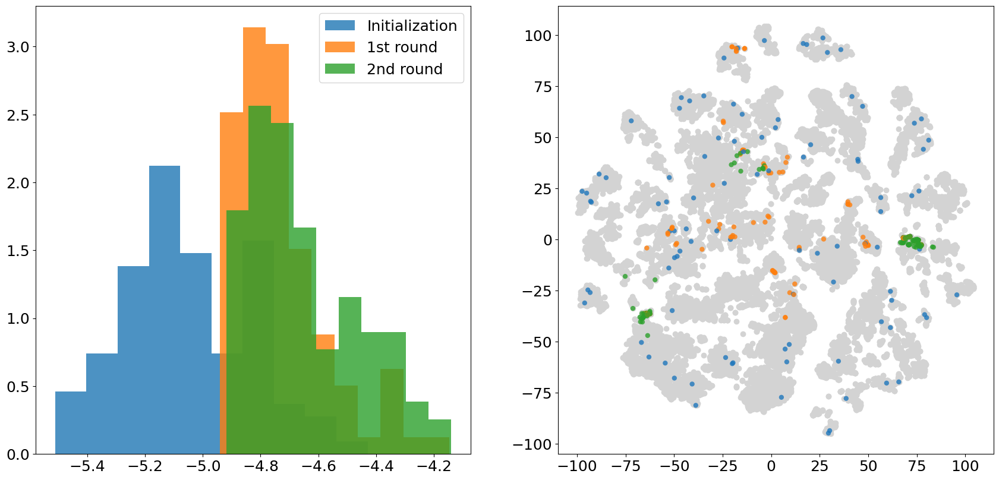

In [24]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20.8, 9.8)
ax[0].hist(target1, bins=10, density=True, alpha=.8, label="Initialization")
ax[0].hist(target2, bins=10, density=True, alpha=.8, label="1st round")
ax[0].hist(target3, bins=10, density=True, alpha=.8, label="2nd round")

ax[1].scatter(emb_2d[:, 0], emb_2d[:, 1], color='lightgrey')
for i, name in enumerate(all_mofs):
    if name in mof1:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.8, ec=None)      
    if name in mof2:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)
    if name in mof3:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)


ax[0].legend()

#### 4. 3rd round

In [25]:
top3 = topn(explored_mofs, explored_targets, 10)

In [26]:
mof4 = []
for c in top3:
    recm = arc_model.dv.most_similar(c, topn=20)
    recm_names = [x[0] for x in recm]
    mof4 += recm_names

mof4 = np.unique(mof4)
target4 = [df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in mof4]
mof4 = topn(mof4, target4, 100)
target4 = [df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in mof4]

In [27]:
explored_mofs = np.unique(np.concatenate((mof1, mof2, mof3, mof4)))
explored_targets = np.array([df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in explored_mofs])

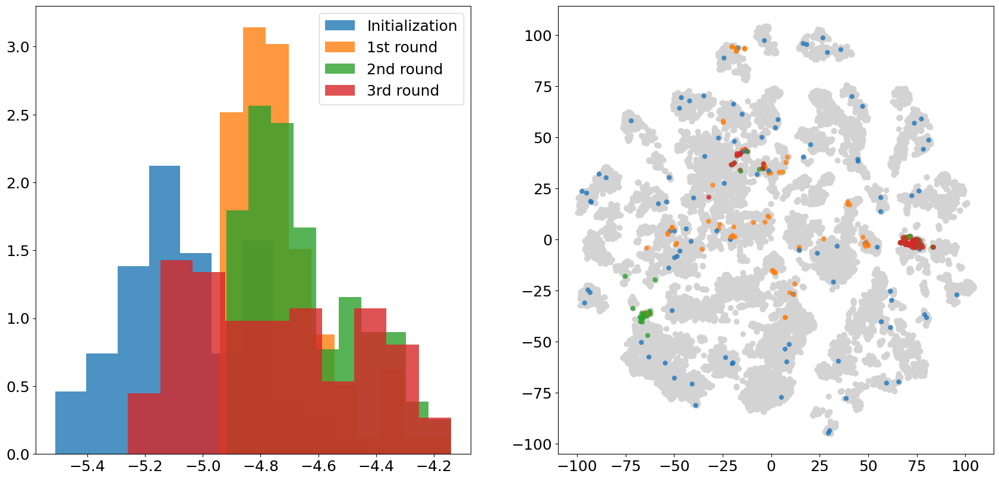

In [28]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20.8, 9.8)
ax[0].hist(target1, bins=10, density=True, alpha=.8, label="Initialization")
ax[0].hist(target2, bins=10, density=True, alpha=.8, label="1st round")
ax[0].hist(target3, bins=10, density=True, alpha=.8, label="2nd round")
ax[0].hist(target4, bins=10, density=True, alpha=.8, label="3rd round")

ax[1].scatter(emb_2d[:, 0], emb_2d[:, 1], color='lightgrey')
for i, name in enumerate(all_mofs):
    if name in mof1:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.8, ec=None)      
    if name in mof2:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)
    if name in mof3:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)
    if name in mof4:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#d62728', alpha=.8, ec=None)


ax[0].legend()

#### 5. 4th round

In [29]:
top4 = topn(explored_mofs, explored_targets, 10)

In [30]:
mof5 = []
for c in top4:
    recm = arc_model.dv.most_similar(c, topn=20)
    recm_names = [x[0] for x in recm]
    mof5 += recm_names

mof5 = np.unique(mof5)
target5 = [df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in mof5]
mof5 = topn(mof5, target5, 100)
target5 = [df[df["info.name"] == x]["xq.ch4_logkh"].values[0] for x in mof5]

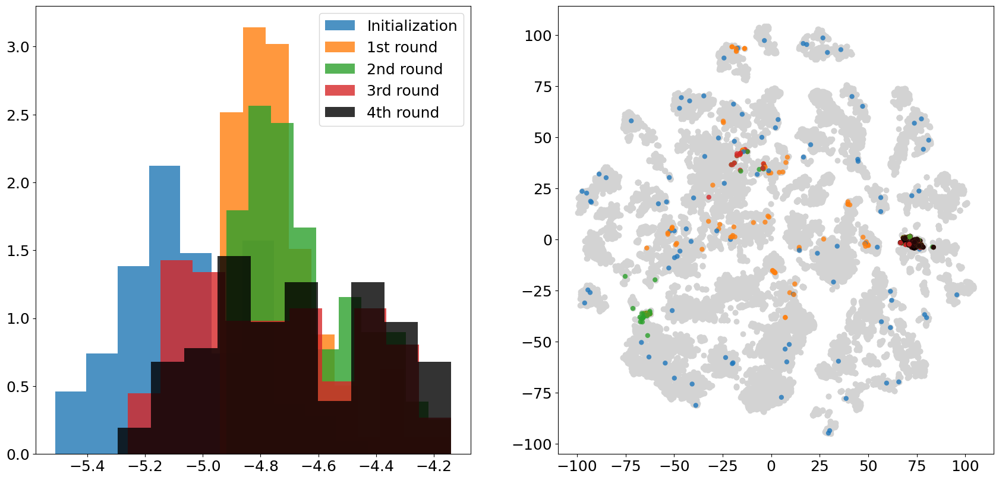

In [31]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20.8, 9.8)
ax[0].hist(target1, bins=10, density=True, alpha=.8, label="Initialization")
ax[0].hist(target2, bins=10, density=True, alpha=.8, label="1st round")
ax[0].hist(target3, bins=10, density=True, alpha=.8, label="2nd round")
ax[0].hist(target4, bins=10, density=True, alpha=.8, label="3rd round")
ax[0].hist(target5, bins=10, density=True, alpha=.8, label="4th round", color="black")

ax[1].scatter(emb_2d[:, 0], emb_2d[:, 1], color='lightgrey')
for i, name in enumerate(all_mofs):
    if name in mof1:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.8, ec=None)      
    if name in mof2:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)
    if name in mof3:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)
    if name in mof4:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#d62728', alpha=.8, ec=None)
    if name in mof5:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='black', alpha=.8, ec=None)


ax[0].legend()

### Target2. Multiple targets

In [17]:
df["xq.ch4_wc"] = df["xq.ch4_uptake_6500000"].values - df["xq.ch4_uptake_580000"].values

In [18]:
CH4_TARGETS = ["xq.ch4_logkh", "xq.ch4_wc"]

In [19]:
N = 1000
N_top = int(N/50)

#### 1. Initialization

In [20]:
random.seed(2023)
ch4_mof1 = random.choices(df[ARC_ID].values, k=N)
[kh1, ch4_wc1] = target_mapping(df, ARC_ID, CH4_TARGETS, ch4_mof1)

In [21]:
explored_ch4_mofs = ch4_mof1
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

In [22]:
ch4_top1 = top_rank(explored_ch4_mofs, [explored_ch4_kh, explored_ch4_wc], N_top)

#### 2. 1st round

In [23]:
ch4_mof2, [kh2, ch4_wc2], ch4_cos1 = batch_recommendation(arc_model, ch4_top1, df, ARC_ID, CH4_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81


In [24]:
explored_ch4_mofs = np.unique(np.concatenate((ch4_mof1, ch4_mof2)))
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

In [25]:
ch4_top2 = top_rank(explored_ch4_mofs,[explored_ch4_kh, explored_ch4_wc], N_top)

#### 3. 2nd round

In [26]:
ch4_mof3, [kh3, ch4_wc3], ch4_cos2 = batch_recommendation(arc_model, ch4_top2, df, ARC_ID, CH4_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002


In [27]:
explored_ch4_mofs = np.unique(np.concatenate((ch4_mof1, ch4_mof2, ch4_mof3)))
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

In [28]:
ch4_top3 = top_rank(explored_ch4_mofs, [explored_ch4_kh, explored_ch4_wc], N_top)

#### 4. 3rd round

In [29]:
ch4_mof4, [kh4, ch4_wc4], ch4_cos3 = batch_recommendation(arc_model, ch4_top3, df, ARC_ID, CH4_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001


In [30]:
explored_ch4_mofs = np.unique(np.concatenate((ch4_mof1, ch4_mof2, ch4_mof3, ch4_mof4)))
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

In [31]:
ch4_top4 = top_rank(explored_ch4_mofs,[explored_ch4_kh, explored_ch4_wc], N_top)

#### 5. 4th round

In [32]:
ch4_mof5, [kh5, ch4_wc5], ch4_cos5 = batch_recommendation(arc_model, ch4_top4, df, ARC_ID, CH4_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002


In [33]:
explored_ch4_mofs = np.unique(np.concatenate((ch4_mof1, ch4_mof2, ch4_mof3, ch4_mof4, ch4_mof5)))
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

##### Rank change

#### 6. Plot

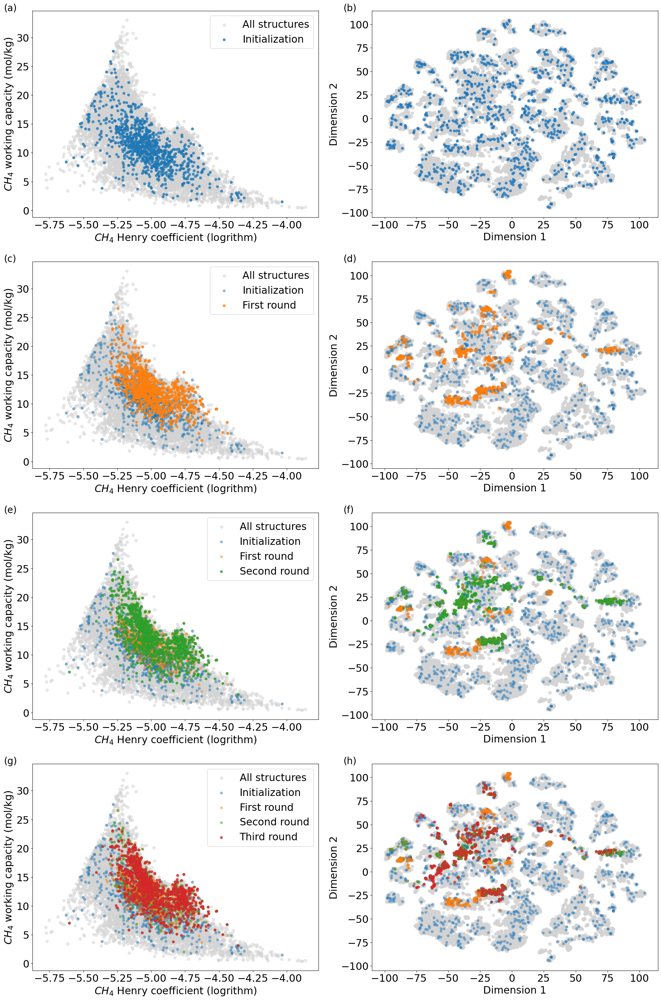

In [230]:
mpl.rcParams["font.size"] = 21.5
plt.rcParams["figure.figsize"] = (20,30)

fig, ax = plt.subplots(4, 2)

ax[0, 0].scatter(df["xq.ch4_logkh"].values, df["xq.ch4_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[0, 0].scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.8, ec=None)

ax[0, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in ch4_mof1:
        ax[0, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.8, ec=None) 


ax[1, 0].scatter(df["xq.ch4_logkh"].values, df["xq.ch4_uptake_6500000"].values-df["xq.ch4_uptake_580000"].values, color="lightgrey", label="All structures", alpha=.5)
ax[1, 0].scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.5, ec=None)
ax[1, 0].scatter(kh2, np.array(ch4_wc2), label="First round", alpha=.8, ec=None)

ax[1, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in ch4_mof1:
        ax[1, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in ch4_mof2:
        ax[1, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)


ax[2, 0].scatter(df["xq.ch4_logkh"].values, df["xq.ch4_uptake_6500000"].values-df["xq.ch4_uptake_580000"].values, color="lightgrey", label="All structures", alpha=.5)
ax[2, 0].scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.5, ec=None)
ax[2, 0].scatter(kh2, np.array(ch4_wc2), label="First round", alpha=.5, ec=None)
ax[2, 0].scatter(kh3, np.array(ch4_wc3), label="Second round", alpha=.8, ec=None)

ax[2, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in ch4_mof1:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in ch4_mof2:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in ch4_mof3:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)


ax[3, 0].scatter(df["xq.ch4_logkh"].values, df["xq.ch4_uptake_6500000"].values-df["xq.ch4_uptake_580000"].values, color="lightgrey", label="All structures", alpha=.5)
ax[3, 0].scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.5, ec=None)
ax[3, 0].scatter(kh2, np.array(ch4_wc2), label="First round", alpha=.5, ec=None)
ax[3, 0].scatter(kh3, np.array(ch4_wc3), label="Second round", alpha=.5, ec=None)
ax[3, 0].scatter(kh4, np.array(ch4_wc4), label="Third round", alpha=.8, ec=None)

ax[3, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in ch4_mof1:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in ch4_mof2:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in ch4_mof3:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.5, ec=None)
    if name in ch4_mof4:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#d62728', alpha=.8, ec=None)
        
for i, axs in enumerate(ax.flat):
    axs.text(-0.1, 1.0, f'({chr(97 + i)})', transform=axs.transAxes, size=20) 

for i in range(4):
    ax[i, 0].set_xlabel("$CH_4$ Henry coefficient (logrithm)")
    ax[i, 0].set_ylabel("$CH_4$ working capacity (mol/kg)")
    ax[i, 0].legend()
for i in range(4):
    ax[i, 1].set_xlabel("Dimension 1")
    ax[i, 1].set_ylabel("Dimension 2")

plt.tight_layout()
# fig.savefig("/Users/xiaoqi/Documents/projects/proj_unsupervisedML/files/figures_oct23/2-ch4_revolution_v11.10.4.png", dpi=300)

## Case 2. CO2/N2 separation

In [34]:
df["xq.co2_n2_selectivity"] = df["xq.co2_kh"].values / df["xq.n2_kh"].values

In [35]:
CO2_TARGETS = ["xq.co2_n2_selectivity", "xq.co2_n2_wc"]

In [36]:
N = 1000
N_top = int(N/40)

In [37]:
random.seed(3388)
co2_mof1 = random.choices(df["info.name"].values, k=N)
[sel1, co2_wc1] = target_mapping(df, ARC_ID, CO2_TARGETS, co2_mof1)

In [38]:
explored_co2_mofs = co2_mof1
[explored_co2_sel, explored_co2_wc] = target_mapping(df, ARC_ID, CO2_TARGETS, explored_co2_mofs)

In [39]:
co2_top1 = top_rank(explored_co2_mofs, [explored_co2_sel, explored_co2_wc], N_top)

In [40]:
co2_mof2, [sel2, co2_wc2], co2_cos1 = batch_recommendation(arc_model, co2_top1, df, ARC_ID, CO2_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81


In [41]:
explored_co2_mofs =  np.unique(np.concatenate((co2_mof1, co2_mof2)))
[explored_co2_sel, explored_co2_wc] = target_mapping(df, ARC_ID, CO2_TARGETS, explored_co2_mofs)

In [42]:
co2_top2 = top_rank(explored_co2_mofs, [explored_co2_sel, explored_co2_wc], N_top)

In [43]:
co2_mof3, [sel3, co2_wc3], co2_cos2 = batch_recommendation(arc_model, co2_top2, df, ARC_ID, CO2_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002
Current ratio: 0.5314410000000002
Current ratio: 0.47829690000000014
Current ratio: 0.43046721000000016
Current ratio: 0.38742048900000015


In [44]:
explored_co2_mofs =  np.unique(np.concatenate((co2_mof1, co2_mof2, co2_mof3)))
[explored_co2_sel, explored_co2_wc] = target_mapping(df, ARC_ID, CO2_TARGETS, explored_co2_mofs)

In [45]:
co2_top3 = top_rank(explored_co2_mofs, [explored_co2_sel, explored_co2_wc], N_top)

In [46]:
co2_mof4, [sel4, co2_wc4], co2_cos3 = batch_recommendation(arc_model, co2_top3, df, ARC_ID, CO2_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002
Current ratio: 0.5314410000000002


In [47]:
explored_co2_mofs =  np.unique(np.concatenate((co2_mof1, co2_mof2, co2_mof3, co2_mof4)))
[explored_co2_sel, explored_co2_wc] = target_mapping(df, ARC_ID, CO2_TARGETS, explored_co2_mofs)

In [48]:
co2_top4 = top_rank(explored_co2_mofs, [explored_co2_sel, explored_co2_wc], N_top)

In [49]:
co2_mof5, [sel5, co2_wc5], co2_cos4 = batch_recommendation(arc_model, co2_top4, df, ARC_ID, CO2_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002
Current ratio: 0.5314410000000002
Current ratio: 0.47829690000000014


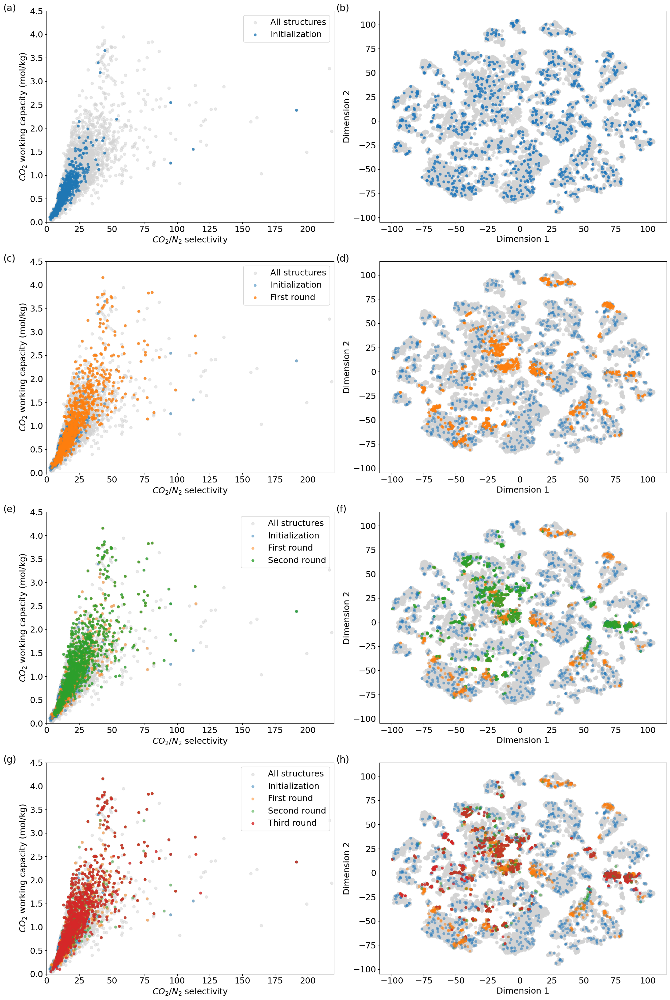

In [35]:
plt.rcParams["figure.figsize"] = (20,30)

fig, ax = plt.subplots(4, 2)

ax[0, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[0, 0].scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.8, ec=None)

ax[0, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[0, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.8, ec=None) 


ax[1, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[1, 0].scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax[1, 0].scatter(sel2, np.array(co2_wc2), label="First round", alpha=.8, ec=None)

ax[1, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[1, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in co2_mof2:
        ax[1, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)


ax[2, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[2, 0].scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax[2, 0].scatter(sel2, np.array(co2_wc2), label="First round", alpha=.5, ec=None)
ax[2, 0].scatter(sel3, np.array(co2_wc3), label="Second round", alpha=.8, ec=None)

ax[2, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in co2_mof2:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in co2_mof3:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)


ax[3, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[3, 0].scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax[3, 0].scatter(sel2, np.array(co2_wc2), label="First round", alpha=.5, ec=None)
ax[3, 0].scatter(sel3, np.array(co2_wc3), label="Second round", alpha=.5, ec=None)
ax[3, 0].scatter(sel4, np.array(co2_wc4), label="Third round", alpha=.8, ec=None)

ax[3, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in co2_mof2:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in co2_mof3:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.5, ec=None)
    if name in co2_mof4:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#d62728', alpha=.8, ec=None)
        
"""
ax[4, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[4, 0].scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax[4, 0].scatter(sel2, np.array(co2_wc2), label="1st round", alpha=.5, ec=None)
ax[4, 0].scatter(sel3, np.array(co2_wc3), label="2nd round", alpha=.5, ec=None)
ax[4, 0].scatter(sel4, np.array(co2_wc4), label="3rd round", alpha=.5, ec=None)
ax[4, 0].scatter(sel5, np.array(co2_wc5), label="4th round", alpha=.8, ec=None)

ax[4, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[4, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in co2_mof2:
        ax[4, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in co2_mof3:
        ax[4, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.5, ec=None)
    if name in co2_mof4:
        ax[4, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#d62728', alpha=.5, ec=None)
    if name in co2_mof5:
        ax[4, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#9467bd', alpha=.8, ec=None)

"""
for i, axs in enumerate(ax.flat):
    axs.text(-0.15, 1.0, f'({chr(97 + i)})', transform=axs.transAxes, size=20) 

for i in range(4):
    ax[i, 0].set_xlabel("$CO_2/N_2$ selectivity")
    ax[i, 0].set_ylabel("$CO_2$ working capacity (mol/kg)")
    ax[i, 0].set_xlim([0, 220])
    ax[i, 0].set_ylim([0, 4.5])
    ax[i, 0].legend()
for i in range(4):
    ax[i, 1].set_xlabel("Dimension 1")
    ax[i, 1].set_ylabel("Dimension 2")

plt.tight_layout()
# fig.savefig("/Users/xiaoqi/Documents/projects/proj_unsupervisedML/files/figures_oct23/3-co2_n2_revolution_v24.01.29.png", dpi=300)

In [43]:
fig = plt.figure(figsize=(6, 6))
plt.scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in co2_mof2:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in co2_mof3:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.5, ec=None)
    if name in co2_mof4:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='#d62728', alpha=.8, ec=None)
plt.xlabel('Dimension 1', fontsize = 14)
plt.ylabel('Dimension 2', fontsize = 14)
plt.savefig(f'./img_{4}.png', 
            transparent = False,  
            facecolor = 'white'
            )
plt.close()

In [45]:
import matplotlib.pyplot as plt
import imageio

In [47]:
frames = []
for i in range(4):
    image = imageio.v2.imread(f'./img_{i+1}.png')
    frames.append(image)

In [51]:
imageio.mimsave('./example.gif', # output gif
                frames,          # array of input frames
                fps = 1)         # optional: frames per second

In [ ]:
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in co2_mof2:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in co2_mof3:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)

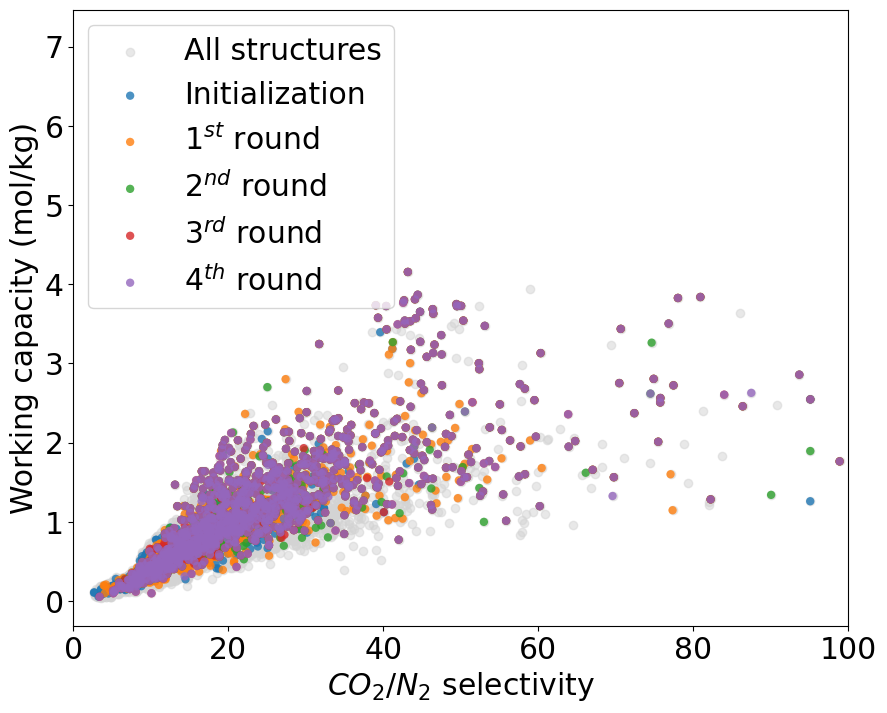

In [74]:
plt.rcParams["figure.figsize"] = (10,8)
plt.scatter(df[CO2_TARGETS[0]].values, df[CO2_TARGETS[1]].values, color="lightgrey", label="All structures", alpha=.5)
plt.scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.8, ec=None)
plt.scatter(sel2, np.array(co2_wc2), label="$1^{st}$ round", alpha=.8, ec=None)
plt.scatter(sel3, np.array(co2_wc3), label="$2^{nd}$ round", alpha=.8, ec=None)
plt.scatter(sel4, np.array(co2_wc4), label="$3^{rd}$ round", alpha=.8, ec=None)
plt.scatter(sel5, np.array(co2_wc5), label="$4^{th}$ round", alpha=.8, ec=None)

plt.xlim([0, 100])

plt.xlabel("$CO_2/N_2$ selectivity")
plt.ylabel("Working capacity (mol/kg)")
plt.legend()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


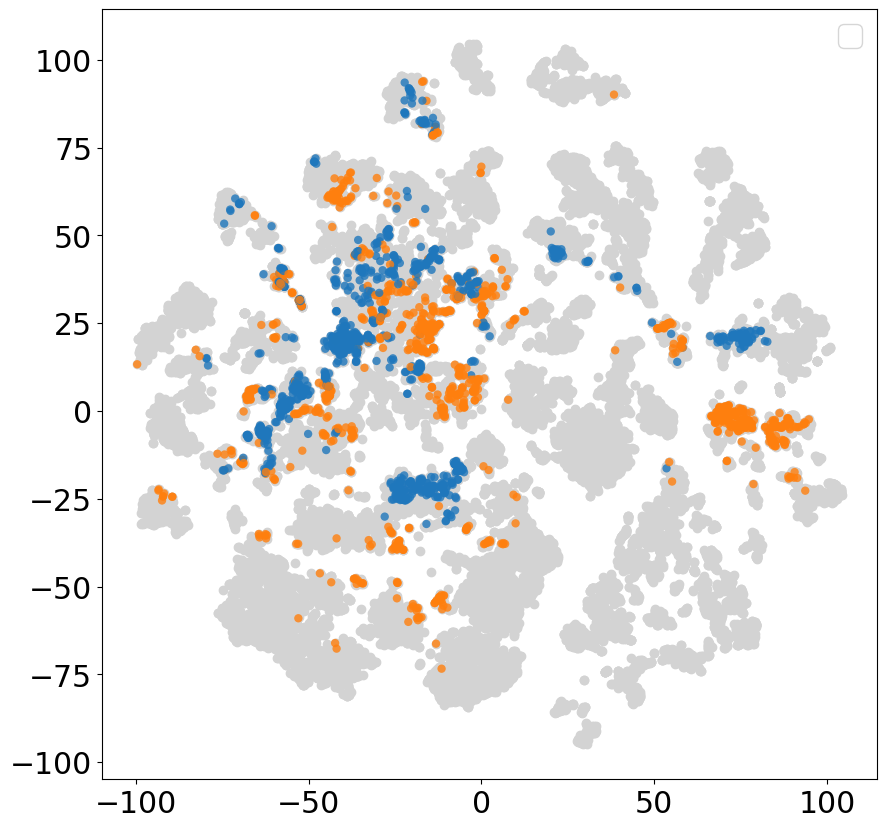

In [75]:
plt.figure(figsize=(10, 10))
plt.scatter(emb_2d[:, 0], emb_2d[:, 1], color='lightgrey')

for i, name in enumerate(all_mofs):
    if name in ch4_mof4:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.8, ec=None)   
    if name in co2_mof4:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)
"""        
    if name in mul_mof3:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.5, ec=None)
    if name in mul_mof4:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='#d62728', alpha=.5, ec=None)
   """     
plt.legend()

## SI. Bandgap

### 1. Loading data

In [41]:
QMOF_MODEL_PATH = "../experiments/workflow/wandb/offline-run-20231031_183003-6cc81vtq/tmp/embedding_model.pt"

QMOF_CORPUS_CONFIG = {
  "embed_label": True,
  "label_path": "../data/qmof-data.csv",
  "descriptors_to_embed": ["info.pld", "info.lcd", "info.density"],
  "category_to_embed": [],
  "tags_to_embed": [], 
  "id_column": "info.name",
  "wl_step": 2,
  "n_components": 2,
  "use_hash": False,
  "writing_style": "paragraph",
  "composition": False,
  "mode": "all",
  "embed_cif": False
}

QMOF_CIF = ["../data/cifs/qmof/"]

qmof_df = pd.read_csv("../data/qmof-data.csv")

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_5831/1399437187.py:21: DtypeWarning: Columns (41,42,44,45,46,47,48,50,51,52,53,54,56,57,58,66,67,68,69,70,78,79,80,81,82,90,91,92,93,94) have mixed types. Specify dtype option on import or set low_memory=False.
  qmof_df = pd.read_csv("../data/qmof-data.csv")


In [42]:
qmof_model = Doc2Vec.load(QMOF_MODEL_PATH)

In [43]:
QMOF_ID = "qmof_id"
TARGET = ["outputs.pbe.bandgap"]

### 2. Embedding

In [45]:
qmofs = qmof_model.dv.index_to_key
qmof_emb = np.array([qmof_model.dv[x] for x in qmofs])
qmof_2d = projector.fit_transform(qmof_emb)
len(qmofs), qmof_2d.shape

(20375, (20375, 2))

### 3. For bandgap

#### 1. Initialization

In [46]:
N = 1000
N_top = int(N/20)

In [47]:
qmof1 = random.choices(qmof_df[QMOF_ID].values, k=N)
[bandgap1] = target_mapping(qmof_df, QMOF_ID, TARGET, qmof1) #np.array([qmof_df[qmof_df[QMOF_ID] == x][TARGET].values[0] for x in qmof1])

In [48]:
explored_qmof = qmof1
[explored_bg] = target_mapping(qmof_df, QMOF_ID, TARGET, explored_qmof)

In [49]:
qtop1 = top_rank(explored_qmof, [explored_bg], N_top)

#### 2. 1st round

In [50]:
qmof2, [bandgap2], qmof_cos1 = batch_recommendation(qmof_model, qtop1, qmof_df, QMOF_ID, TARGET, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001


In [51]:
explored_qmof = np.unique(np.concatenate((qmof1, qmof2)))
[explored_bg] = target_mapping(qmof_df, QMOF_ID, TARGET, explored_qmof)

#### 3. 2nd round

In [52]:
qtop2 = top_rank(explored_qmof, [explored_bg], N_top)

In [53]:
qmof3, [bandgap3], qmof_cos2 = batch_recommendation(qmof_model, qtop2, qmof_df, QMOF_ID, TARGET, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002
Current ratio: 0.5314410000000002
Current ratio: 0.47829690000000014
Current ratio: 0.43046721000000016


In [54]:
explored_qmof = np.unique(np.concatenate((qmof1, qmof2, qmof3)))
explored_bg = target_mapping(qmof_df, QMOF_ID, TARGET, explored_qmof)

#### 4. 3rd round

In [55]:
qtop3 = top_rank(explored_qmof, [explored_bg], N_top)

In [56]:
qmof4, [bandgap4], qmof_cos3 = batch_recommendation(qmof_model, qtop3, qmof_df, QMOF_ID, TARGET, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002
Current ratio: 0.5314410000000002
Current ratio: 0.47829690000000014
Current ratio: 0.43046721000000016
Current ratio: 0.38742048900000015
Current ratio: 0.34867844010000015


In [57]:
explored_qmof = np.unique(np.concatenate((qmof1, qmof2, qmof3, qmof4)))
explored_bg = target_mapping(qmof_df, QMOF_ID, TARGET, explored_qmof)

In [58]:
import seaborn as sns

In [59]:
len(bandgap1), len(bandgap2), len(bandgap3), len(bandgap4)

(1000, 1000, 1000, 1000)

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_5831/1921597961.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ax=ax[0, 0], a=bandgap1, hist=True, label="Initialization")
/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_5831/1921597961.py:16: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad637

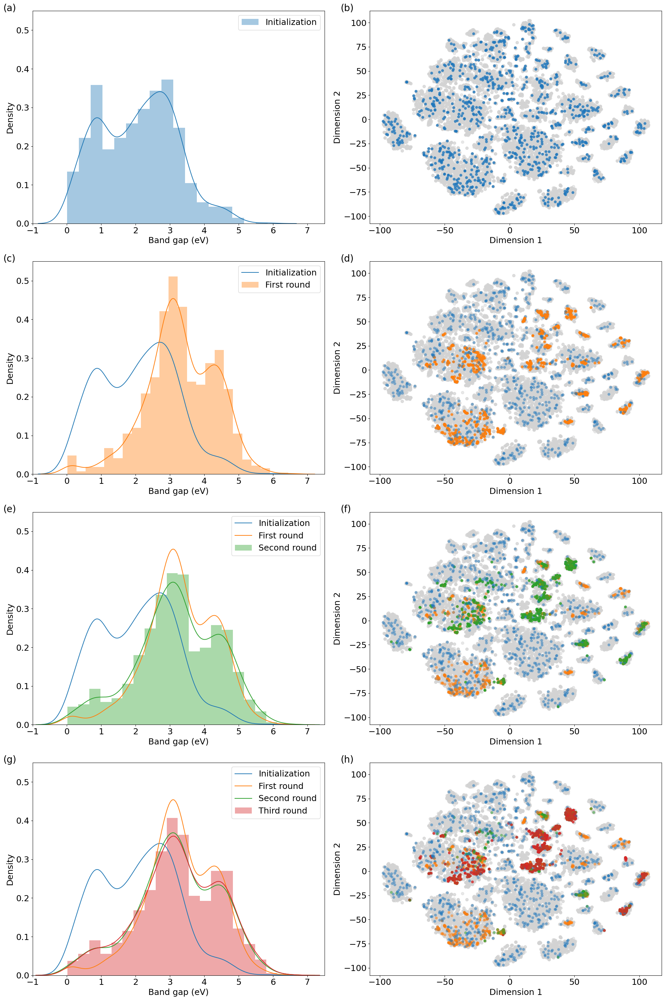

In [61]:
plt.rcParams["figure.figsize"] = (20,30)

fig, ax = plt.subplots(4, 2)

#ax[0, 0].hist(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
sns.distplot(ax=ax[0, 0], a=bandgap1, hist=True, label="Initialization")
# ax[0, 0].hist(bandgap1, bins=15, density=True, alpha=.8, label="Initialization")

ax[0, 1].scatter(qmof_2d[:, 0], qmof_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(qmofs):
    if name in qmof1:
        ax[0, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#1f77bc', alpha=.8, ec=None) 


#ax[1, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
sns.distplot(ax=ax[1, 0], a=bandgap1, hist=False, label="Initialization")
sns.distplot(ax=ax[1, 0], a=bandgap2, hist=True, label="First round")
# ax[1, 0].hist(bandgap1, bins=15, density=True, alpha=.5, label="Initialization")
# ax[1, 0].hist(bandgap2, bins=15, density=True, alpha=.8, label="First round")

ax[1, 1].scatter(qmof_2d[:, 0], qmof_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(qmofs):
    if name in qmof1:
        ax[1, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in qmof2:
        ax[1, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)


# ax[2, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
# ax[2, 0].hist(bandgap1, bins=15, density=True, alpha=.5, label="Initialization")
# ax[2, 0].hist(bandgap2, bins=15, density=True, alpha=.5, label="First round")
# ax[2, 0].hist(bandgap3, bins=15, density=True, alpha=.8, label="Second round")
sns.distplot(ax=ax[2, 0], a=bandgap1, hist=False, label="Initialization")
sns.distplot(ax=ax[2, 0], a=bandgap2, hist=False, label="First round")
sns.distplot(ax=ax[2, 0], a=bandgap3, hist=True, label="Second round")

ax[2, 1].scatter(qmof_2d[:, 0], qmof_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(qmofs):
    if name in qmof1:
        ax[2, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in qmof2:
        ax[2, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in qmof3:
        ax[2, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)


# ax[3, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
# ax[3, 0].hist(bandgap1, bins=15, density=True, alpha=.5, label="Initialization")
# ax[3, 0].hist(bandgap2, bins=15, density=True, alpha=.5, label="First round")
# ax[3, 0].hist(bandgap3, bins=15, density=True, alpha=.5, label="Second round")
# ax[3, 0].hist(bandgap4, bins=15, density=True, alpha=.8, label="Third round")
sns.distplot(ax=ax[3, 0], a=bandgap1, hist=False, label="Initialization")
sns.distplot(ax=ax[3, 0], a=bandgap2, hist=False, label="First round")
sns.distplot(ax=ax[3, 0], a=bandgap3, hist=False, label="Second round")
sns.distplot(ax=ax[3, 0], a=bandgap4, hist=True, label="Third round")

ax[3, 1].scatter(qmof_2d[:, 0], qmof_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(qmofs):
    if name in qmof1:
        ax[3, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in qmof2:
        ax[3, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in qmof3:
        ax[3, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#2ca02c', alpha=.5, ec=None)
    if name in qmof4:
        ax[3, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#d62728', alpha=.8, ec=None)
        

for i, axs in enumerate(ax.flat):
    axs.text(-0.1, 1.0, f'({chr(97 + i)})', transform=axs.transAxes, size=20) 

for i in range(4):
    ax[i, 0].set_xlabel("Band gap (eV)")
    ax[i, 0].set_ylabel("Density")
    ax[i, 0].set_xlim([-1, 7.5])
    ax[i, 0].set_ylim([0, 0.55])
    ax[i, 0].legend()
for i in range(4):
    ax[i, 1].set_xlabel("Dimension 1")
    ax[i, 1].set_ylabel("Dimension 2")

plt.tight_layout()
fig.savefig("/Users/xiaoqi/Documents/projects/proj_unsupervisedML/files/figures_oct23/3.5-bandgap_revolution_v24.01.29.png", dpi=300)

# Section 2. Substructures analysis

## Test 1. Common substructures in top MOFs

In [ ]:
from collections import Counter

In [105]:
documents, vectors = load_vector(ARC_CIF, arc_model)

/Users/xiaoqi/Documents/projects/proj_unsupervisedML/codes/mofgraph2vec/src/mofgraph2vec/featurize/mof2doc.py:44: DtypeWarning: Columns (23,26,102,103,104,105) have mixed types. Specify dtype option on import or set low_memory=False.
  self.df_label = pd.read_csv(label_path).set_index(id_column)
100%|██████████| 22035/22035 [00:28<00:00, 771.68it/s]


In [ ]:
top1_doc = [documents[t] for t in top1]
top1_doc_flatten = [w for d in top1_doc for w in d]

In [ ]:
mof2_doc = [documents[m] for m in mof2]
mof2_doc_flatten = [w for d in mof2_doc for w in d]

In [ ]:
top2_doc = [documents[m] for m in top2]
top2_doc_flatten = [w for d in top2_doc for w in d]

In [ ]:
mof3_doc = [documents[m] for m in mof3]
mof3_doc_flatten = [w for d in mof3_doc for w in d]

In [ ]:
top3_doc = [documents[m] for m in top3]
top3_doc_flatten = [w for d in top3_doc for w in d]

In [ ]:
top4_doc = [documents[m] for m in top4]
top4_doc_flatten = [w for d in top4_doc for w in d]

In [ ]:
counting = Counter(mof3_doc_flatten)

<BarContainer object of 10 artists>

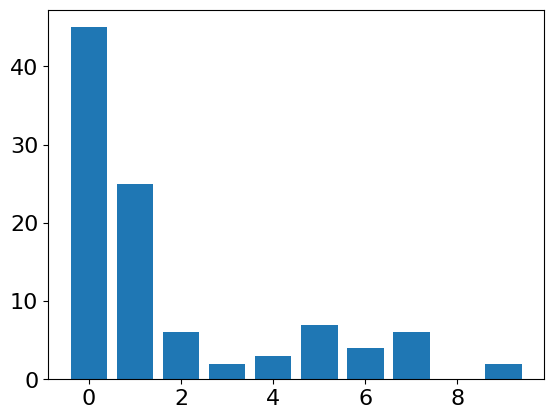

In [ ]:
x = range(10)
xlabels = ["Df_%s" %i for i in range(10)]
y = [counting[l] for l in xlabels]

plt.bar(x, y)

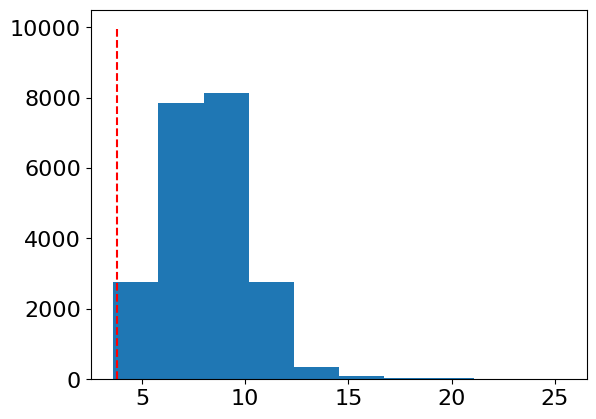

In [ ]:
plt.hist(df['Df'].values)
plt.plot([3.8, 3.8], [0, 10000], 'r--')

## Test 2. Color by metal

In [ ]:
from sklearn.preprocessing import LabelEncoder


In [ ]:
arc_core_mofs = arc_core_model.dv.index_to_key
arc_core_emb = np.array([arc_core_model.dv[x] for x in arc_core_mofs])
projector = TSNE(n_components=2, perplexity=30)
arc_core_emb_2b = projector.fit_transform(arc_core_emb)

In [ ]:
all_doc, _= load_vector(ARC_CORE_CIF, arc_core_model)

/Users/xiaoqi/Documents/projects/proj_unsupervisedML/codes/mofgraph2vec/src/mofgraph2vec/featurize/mof2doc.py:44: DtypeWarning: Columns (23,26,102,103,104,105) have mixed types. Specify dtype option on import or set low_memory=False.
  self.df_label = pd.read_csv(label_path).set_index(id_column)
100%|██████████| 24078/24078 [00:36<00:00, 663.10it/s]


In [ ]:
first_words = [all_doc[m][0] for m in arc_core_mofs]

In [ ]:
label_encoder = LabelEncoder()
colors = label_encoder.fit_transform(first_words)

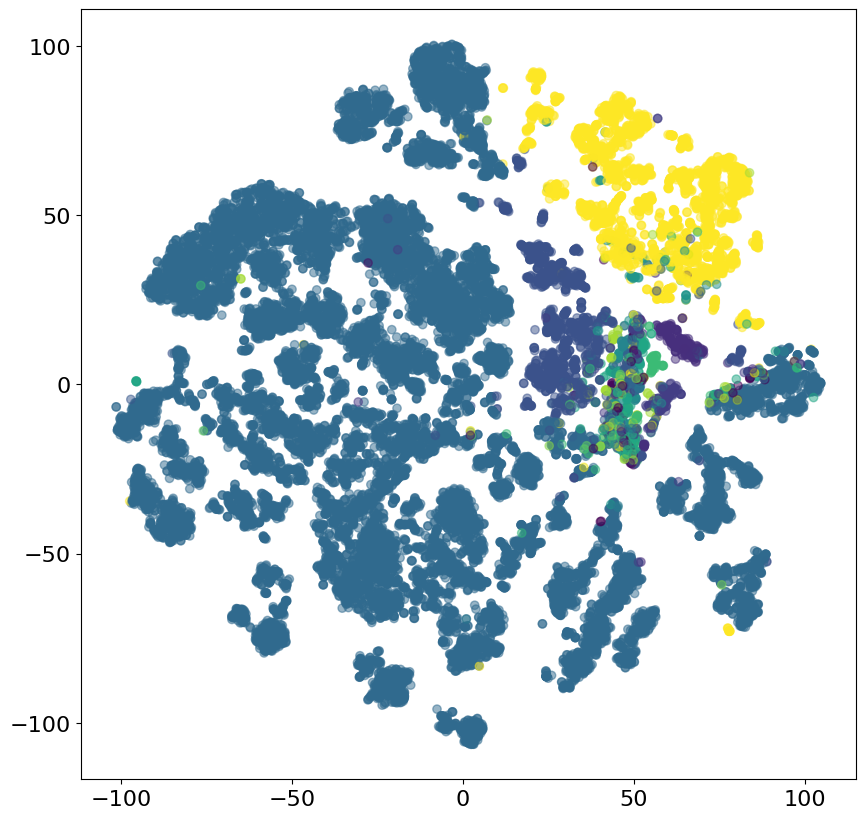

In [ ]:
plt.figure(figsize=(10, 10))
plt.scatter(arc_core_emb_2b[:, 0], arc_core_emb_2b[:, 1], c=colors, alpha=.5)

In [ ]:
Counter(first_words)

Counter({'Zn': 2720,
         'Cu': 1286,
         'Fe': 18778,
         'Li': 38,
         'Cd': 215,
         'K': 25,
         'Yb': 19,
         'Sr': 13,
         'Sc': 6,
         'V': 17,
         'Co': 160,
         'Ag': 64,
         'Ni': 79,
         'Gd': 44,
         'Eu': 59,
         'Er': 23,
         'Mn': 103,
         'Tb': 41,
         'Al': 14,
         'Mg': 34,
         'La': 35,
         'In': 39,
         'Ba': 20,
         'Na': 42,
         'Ce': 21,
         'Ho': 10,
         'U': 21,
         'Nd': 27,
         'H': 4,
         'Pr': 15,
         'Sn': 2,
         'Dy': 27,
         'Ca': 19,
         'Sm': 18,
         'Be': 1,
         'Cr': 8,
         'Ga': 6,
         'Y': 9,
         'Lu': 3,
         'Tm': 4,
         'Rb': 2,
         'Cs': 2,
         'Si': 3,
         'Bi': 1,
         'Nb': 1})

# Section 3. Unsupervised clustering

In [14]:
from sklearn.cluster import DBSCAN

In [15]:
clustering = DBSCAN(eps=0.3, min_samples=5, leaf_size=50, n_jobs=-1).fit(all_emb)
clusters = clustering.labels_

In [16]:
Counter(clusters)

Counter({0: 20959, 1: 623, -1: 415, 4: 5, 3: 7, 6: 4, 5: 5, 2: 10, 7: 7})

In [17]:
df_cluster = pd.DataFrame({"info.name": all_mofs, "class": clusters})

In [18]:
df_cluster_label = df.merge(df_cluster, on="info.name")
df_cluster_label_sub = df_cluster_label[df_cluster_label["class"] != -1]
df_cluster_label_sub = df_cluster_label_sub[df_cluster_label_sub["class"] != 0]

In [19]:
color_dict = {-1: 'lightgrey', 0: 'lightgrey', 1: 'blue', 2: 'orange', 3: 'green',
              4: 'red', 5: 'purple', 6: 'yellow', 7: 'black'}

colors = np.array([color_dict[x] for x in clusters])

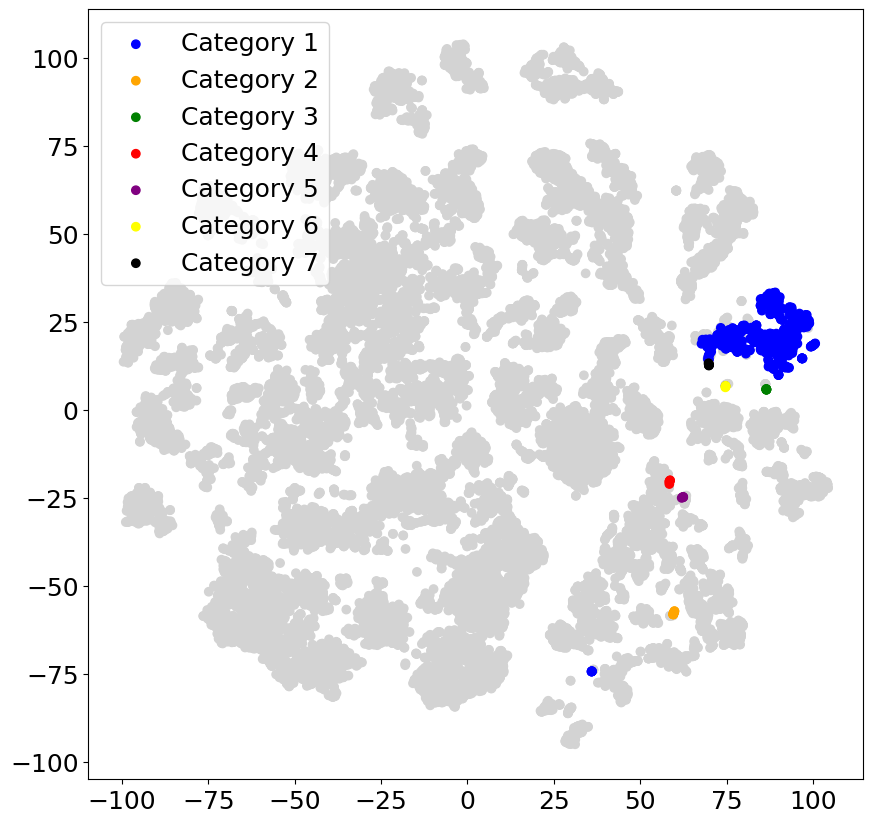

In [20]:
plt.figure(figsize=(10,10))

plt.scatter(emb_2d[clusters == 0][:, 0], emb_2d[clusters == 0][:, 1], c=colors[clusters == 0])
plt.scatter(emb_2d[clusters == -1][:, 0], emb_2d[clusters == -1][:, 1], c=colors[clusters == -1])

for i in range(1, 8):
    plt.scatter(emb_2d[clusters == i][:, 0], emb_2d[clusters == i][:, 1], c=colors[clusters == i], label=f'Category {i}')

plt.legend()
#plt.scatter(emb_2d[:, 0], emb_2d[:, 1], c=colors, alpha=.5, s=5)

In [ ]:
postcom_keys = []
for key in df.keys():
    if "outputs.postcombustion" in key:
        postcom_keys.append(key)

In [ ]:
ranks = df[postcom_keys].rank(method='min', ascending=False)
postcom_rows = df[ranks.le(100).all(axis=1)]
print(len(postcom_rows))

57


In [ ]:
precom_keys = []
for key in df.keys():
    if "outputs.precombustion" in key:
        precom_keys.append(key)

ranks = df[precom_keys].rank(method='min', ascending=False)
precom_rows = df[ranks.le(4000).all(axis=1)]
print(len(precom_rows))

59


In [ ]:
nat_keys = []
for key in df.keys():
    if "outputs.natural_gas" in key:
        nat_keys.append(key)

ranks = df[nat_keys].rank(method='min', ascending=False)
nat_rows = df[ranks.le(700).all(axis=1)]
print(len(nat_rows))

62


In [ ]:
land_keys = []
for key in df.keys():
    if "outputs.landfill_gas" in key:
        land_keys.append(key)

ranks = df[land_keys].rank(method='min', ascending=False)
land_rows = df[ranks.le(600).all(axis=1)]
print(len(land_rows))

56


In [ ]:
methane_keys = []
for key in df.keys():
    if "outputs.methane" in key:
        methane_keys.append(key)

ranks = df[methane_keys].rank(method='min', ascending=False)
methane_rows = df[ranks.le(1800).all(axis=1)]
print(len(methane_rows))

58


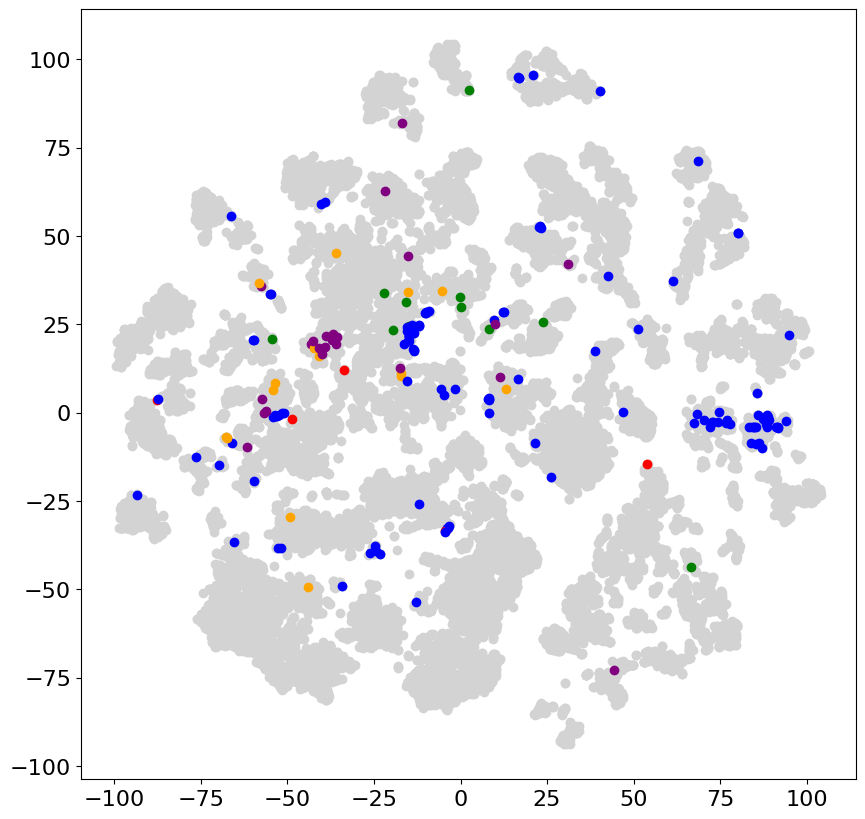

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(emb_2d[:, 0], emb_2d[:, 1], color='lightgrey')

for i, name in enumerate(all_mofs):
    if name in postcom_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='blue')
    elif name in precom_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='orange')
    elif name in nat_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='green')
    elif name in land_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='red')
    elif name in methane_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='purple')

# Section 4. Substructure similarities

In [14]:
func = [
    'N_C_H_H', 'N_C_O_O', 
    'O_C_H', 
    'F_C', 'Cl_C', 'Br_C', 'I_C',
    'C_H_H_H_O', 'C_C_H_H_H',
    'H_C',
    'S_C_O_O', 'C_C_F_F_F'
]
func_vec =  [arc_core_model.wv[fu] for fu in func] 
func_matrix = [
    [1 - arc_core_model.wv.distance(w1=i, w2=j) for j in func] for i in func
]

In [15]:
func_name = [
    '$-NH_2$', '$-NO_2$',
    '-OH', 
    '-F', '-Cl', '-Br', '-I',
    '$-O-CH_3$', '$-CH_3$',
    '-H',
    '$-SO_2$', '$-CF_3$'
]

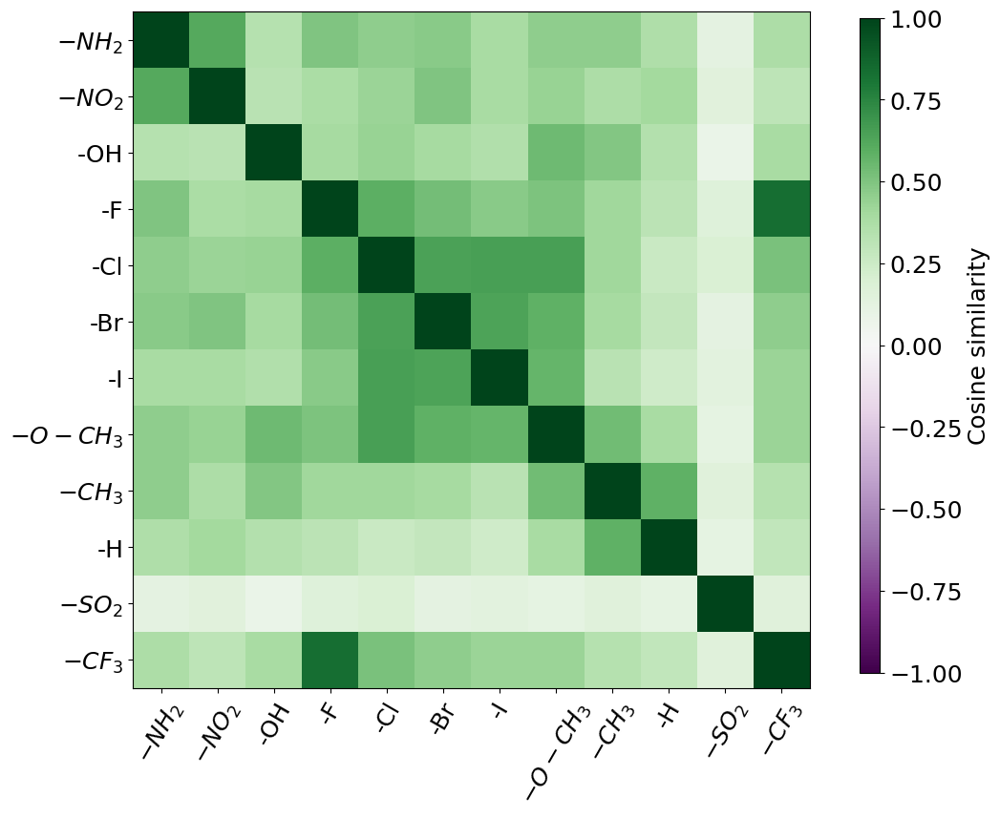

<Figure size 1050x980 with 0 Axes>

In [22]:
plt.rcParams["figure.figsize"] = (10.5,9.8)
fig, ax = plt.subplots(nrows=1, ncols=1)

im = ax.imshow(func_matrix, vmin=-1, vmax=1, cmap='PRGn')

ax.set_xticks(range(len(func)), labels=func_name, rotation=60, fontsize=18)
ax.set_yticks(range(len(func)), labels=func_name)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax, shrink=0.1, pad=0.02, label='Cosine similarity')

    
plt.show()
plt.tight_layout()

fig.savefig("/Users/xiaoqi/Documents/projects/proj_unsupervisedML/files/figures_oct23/SI-similarity_v24.02.21.png", dpi=600)

NameError: name 'fig' is not defined

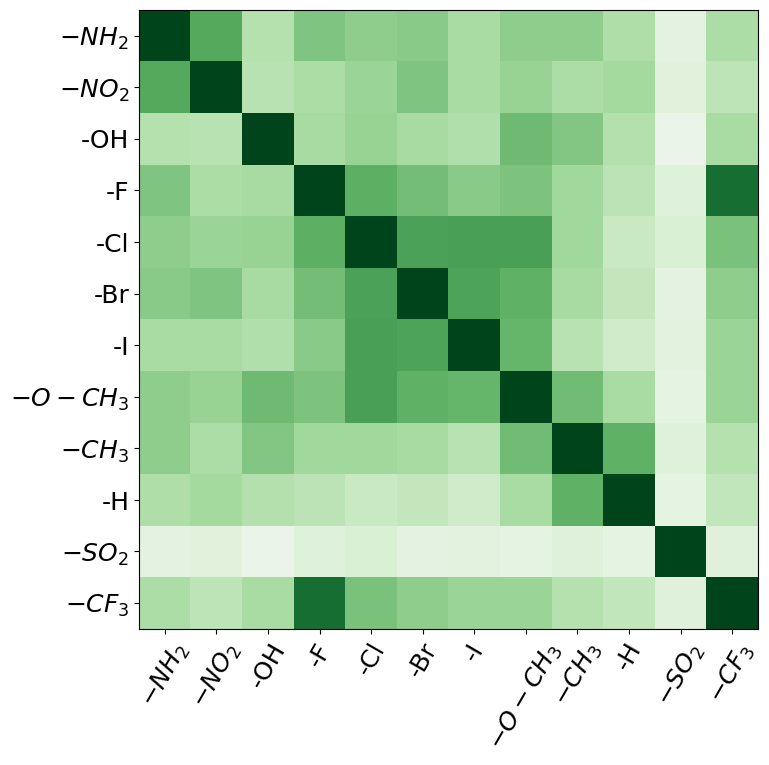

In [74]:
plt.figure(figsize=(8, 8))
func_name = [
    '$-NH_2$', '$-NO_2$',
    '-OH', 
    '-F', '-Cl', '-Br', '-I',
    '$-O-CH_3$', '$-CH_3$',
    '-H',
    '$-SO_2$', '$-CF_3$'
]
plt.xticks(range(len(func)), labels=func_name, rotation=60, fontsize=18)
plt.yticks(range(len(func)), labels=func_name)
im = plt.imshow(func_matrix, cmap='PRGn', interpolation='nearest', vmin=-1, vmax=1)
# plt.colorbar(label='Cosine similarity')
plt.tight_layout()

fig.subplots_adjust(right=0.9)
plt.tight_layout(pad=0, w_pad=0, h_pad=0)
cbar_ax = fig.add_axes([1.03, 0.1, 0.01, 0.7])
fig.colorbar(im, cax=cbar_ax, label='Cosine similarity')

In [11]:
topo = np.unique(df['Crystalnet'].values)
topo_vec =  [arc_model.wv[tp] for tp in topo] 
topo_matrix = [
    [1-arc_model.wv.distance(w1=i, w2=j) for j in topo] for i in topo
]

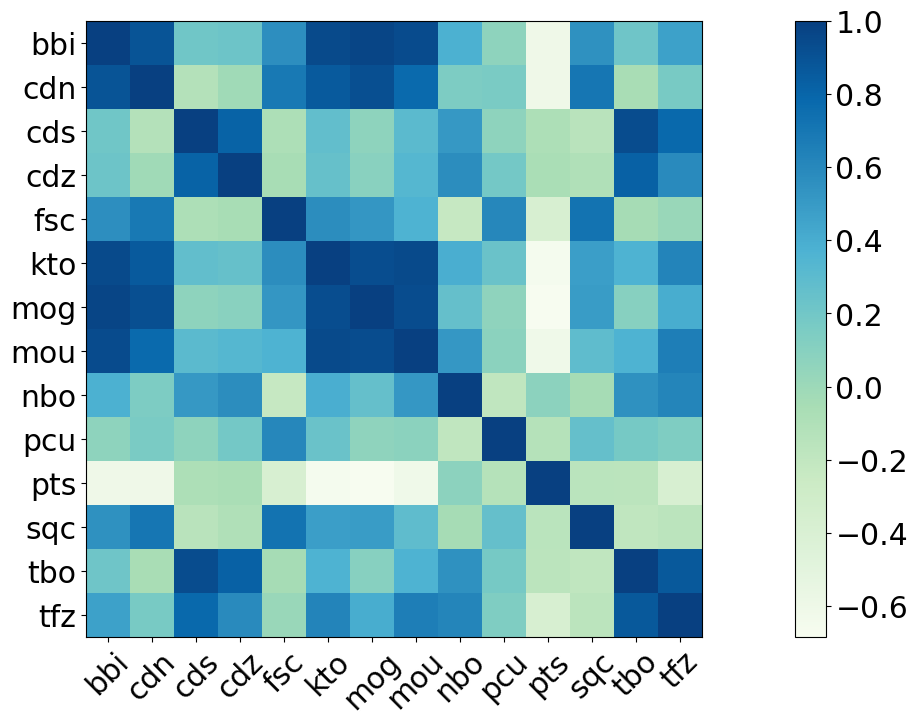

In [372]:
plt.xticks(range(len(topo)), labels=topo, rotation=45)
plt.yticks(range(len(topo)), labels=topo)
plt.imshow(topo_matrix, cmap='GnBu', interpolation='nearest')
plt.colorbar()
plt.tight_layout()

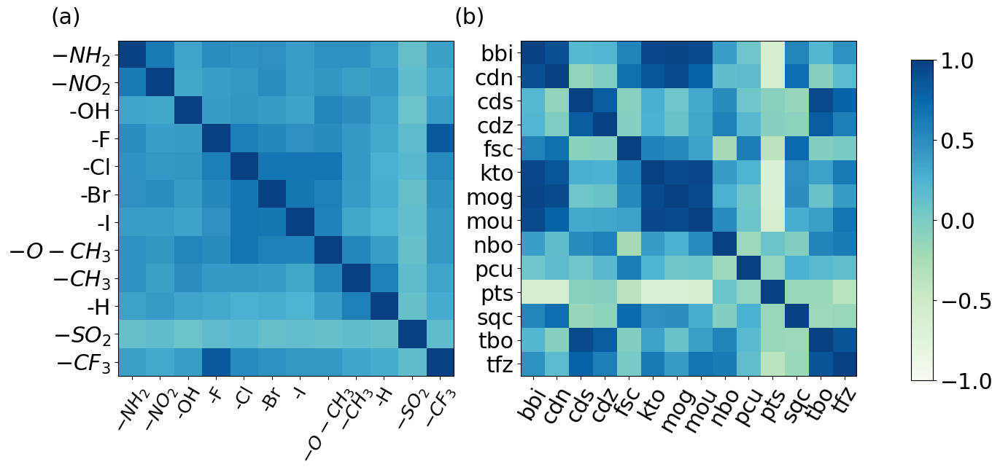

<Figure size 1500x800 with 0 Axes>

In [440]:
plt.rcParams["figure.figsize"] = (15,8)
fig, ax = plt.subplots(nrows=1, ncols=2)

im = ax[0].imshow(func_matrix, vmin=-1, vmax=1, cmap='GnBu')
im = ax[1].imshow(topo_matrix, vmin=-1, vmax=1, cmap='GnBu')

ax[0].set_xticks(range(len(func)), labels=func_name, rotation=60, fontsize=18)
ax[0].set_yticks(range(len(func)), labels=func_name)

ax[1].set_xticks(range(len(topo)), labels=topo, rotation=60)
ax[1].set_yticks(range(len(topo)), labels=topo)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.2, 0.02, 0.55])
fig.colorbar(im, cax=cbar_ax, shrink=0.1, pad=0.02)

for i, axs in enumerate(ax.flat):
    axs.text(-.2, 1.05, f'({chr(97 + i)})', transform=axs.transAxes) 
    
plt.show()
plt.tight_layout()
# fig.savefig("/Users/xiaoqi/Documents/projects/proj_unsupervisedML/files/figures_oct23/SI-similarity.png", dpi=600)

# Section 5. K-means cluster

In [50]:
df["xq.ch4_logkh_rank"] = len(df) - ss.rankdata(df["xq.ch4_logkh"])
df["xq.ch4_wc_rank"] = len(df) - ss.rankdata(df["xq.ch4_wc"])

df["xq.co2_n2_selectivity_rank"] = len(df) - ss.rankdata(df["xq.co2_n2_selectivity"])
df["xq.co2_n2_wc_rank"] = len(df) - ss.rankdata(df["xq.co2_n2_wc"])

In [56]:
df['xq.ch4_rank'] = df["xq.ch4_logkh_rank"].values + df["xq.ch4_wc_rank"].values
df['xq.co2_rank'] = df["xq.co2_n2_selectivity_rank"].values + df["xq.co2_n2_wc_rank"].values

In [57]:
# ch4_best = df[(df["xq.ch4_logkh_rank"] < 5000) & (df["xq.ch4_wc_rank"] < 5000)][ARC_ID].values
# co2_best = df[(df["xq.co2_n2_selectivity_rank"] < 200) & (df["xq.co2_n2_wc_rank"] < 200)][ARC_ID].values

ch4_best = df[(df["xq.ch4_rank"] < 8000)][ARC_ID].values
co2_best = df[(df["xq.co2_rank"] < 300)][ARC_ID].values

len(ch4_best), len(co2_best)

(77, 99)

In [58]:
recm_ch4_best = top_rank(explored_ch4_mofs,[explored_ch4_kh, explored_ch4_wc], 77)
recm_co2_best = top_rank(explored_co2_mofs,[explored_co2_sel, explored_co2_wc], 99)

In [60]:
def kmeans_clustering(num_class, embeddings_to_cluster, embeddings_2d):
    cluster = KMeans(n_clusters=num_class, init='k-means++', random_state=1414)
    cluster.fit(embeddings_to_cluster)
    classes = cluster.labels_
    
    plt.figure(figsize=(7,5))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=classes, cmap=plt.cm.get_cmap('Set3', num_class), alpha=.5)
    plt.colorbar(ticks=range(num_class))

    plt.axis('off')
    for i, name in enumerate(all_mofs):
        if name in ch4_best: 
            plt.scatter(embeddings_2d[i, 0], embeddings_2d[i, 1], marker='+', ec='#ff7f0e', facecolors='none')
        if name in recm_ch4_best:
            plt.scatter(embeddings_2d[i, 0], embeddings_2d[i, 1], marker='x', ec='#d62728', facecolors='none')
        if name in co2_best: #
            plt.scatter(embeddings_2d[i, 0], embeddings_2d[i, 1], marker='^', ec='#173f5f', facecolors='none')
        if name in recm_co2_best:
            plt.scatter(embeddings_2d[i, 0], embeddings_2d[i, 1], marker='v', ec='#20639b', facecolors='none')

    plt.text(-25, 25, "B")
    plt.text(-48, 24, "A")


    scatters = [
        plt.scatter([], [], marker='+', ec='#ff7f0e', facecolors='none'),
        plt.scatter([], [], marker='x', ec='#d62728', facecolors='none'),
        plt.scatter([], [], marker='^', ec='#173f5f', facecolors='none'),
        plt.scatter([], [], marker='v', ec='#20639b', facecolors='none')
    ]        
    plt.legend(scatters, ['Methane storage candidates', 'Methane storage recommendations', 'Carbon capture candidates', 'Carbon capture recommendations'], prop={'size': 8}, bbox_to_anchor=(-0.2, 1), loc='upper left')
    plt.tight_layout()

/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_2791/941585984.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=classes, cmap=plt.cm.get_cmap('Set3', num_class), alpha=.5)
/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/

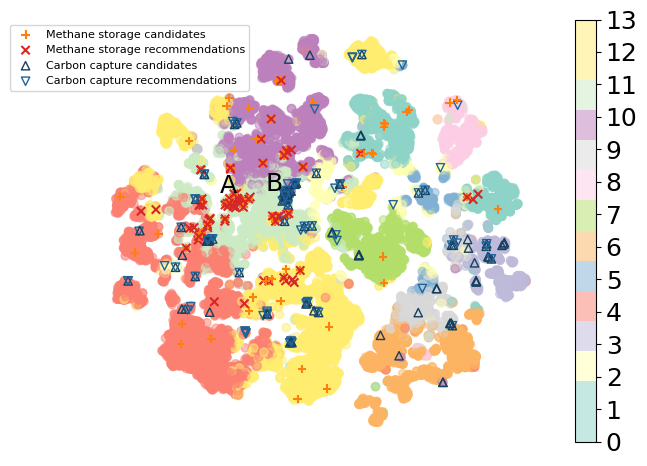

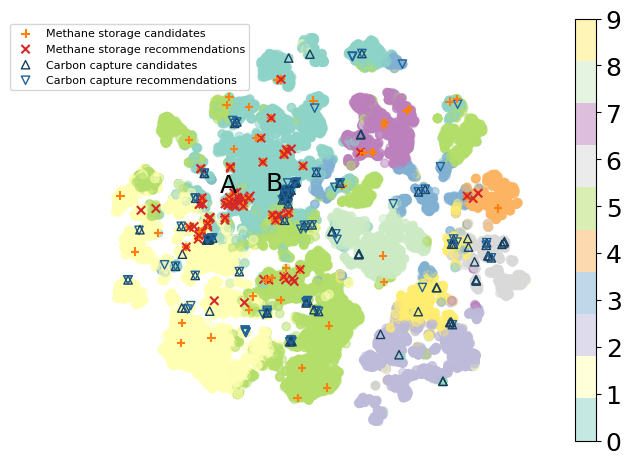

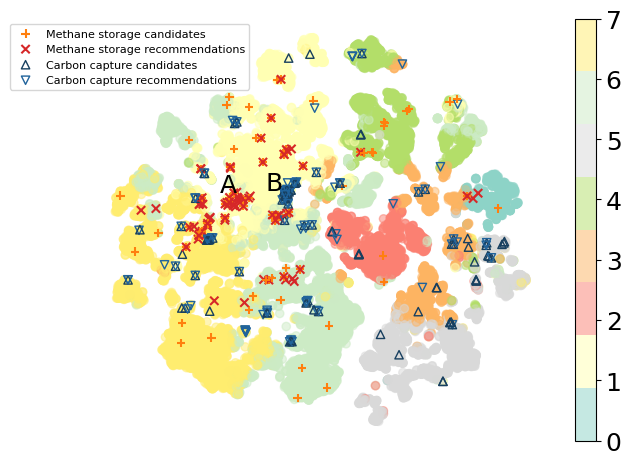

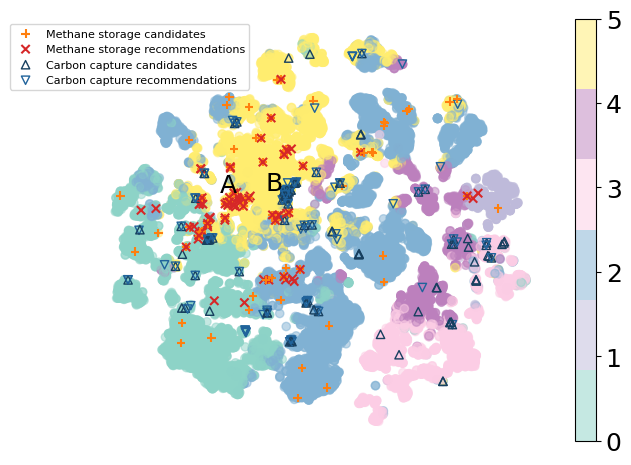

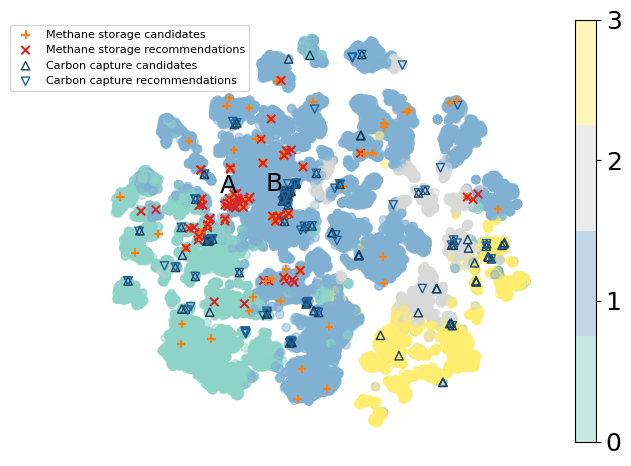

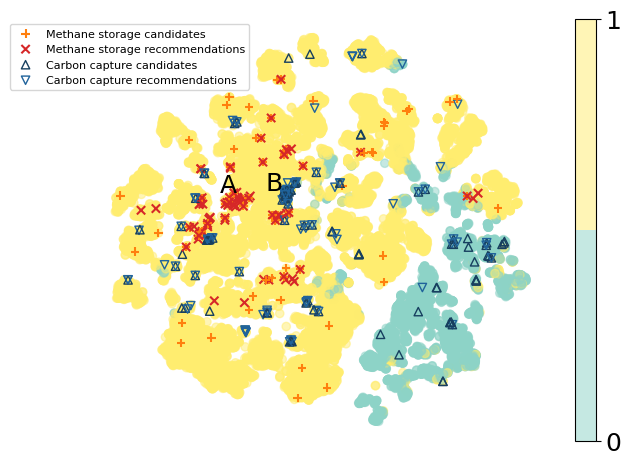

In [61]:
for num in [14, 10, 8, 6, 4, 2]:
    kmeans_clustering(num, all_emb, emb_2d)

In [62]:
num_classes = 10

In [63]:
cluster = KMeans(n_clusters=num_classes, init='k-means++', random_state=1414)

In [64]:
cluster.fit(all_emb)

/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=10, random_state=1414)

In [66]:
classes = cluster.labels_

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_2791/1884483818.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(emb_2d[:, 0], emb_2d[:, 1], c=classes, cmap=plt.cm.get_cmap('Set3', num_classes), alpha=.8)


'for i, name in enumerate(all_mofs):\n    if name in postcom_rows["info.name"].values:\n        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color=\'blue\', marker=\'X\')\n    elif name in precom_rows["info.name"].values:\n        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color=\'orange\', marker=\'X\')\n    elif name in nat_rows["info.name"].values:\n        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color=\'green\', marker=\'X\')\n    elif name in land_rows["info.name"].values:\n        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color=\'red\', marker=\'X\')\n    elif name in methane_rows["info.name"].values:\n        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color=\'purple\', marker=\'X\')'

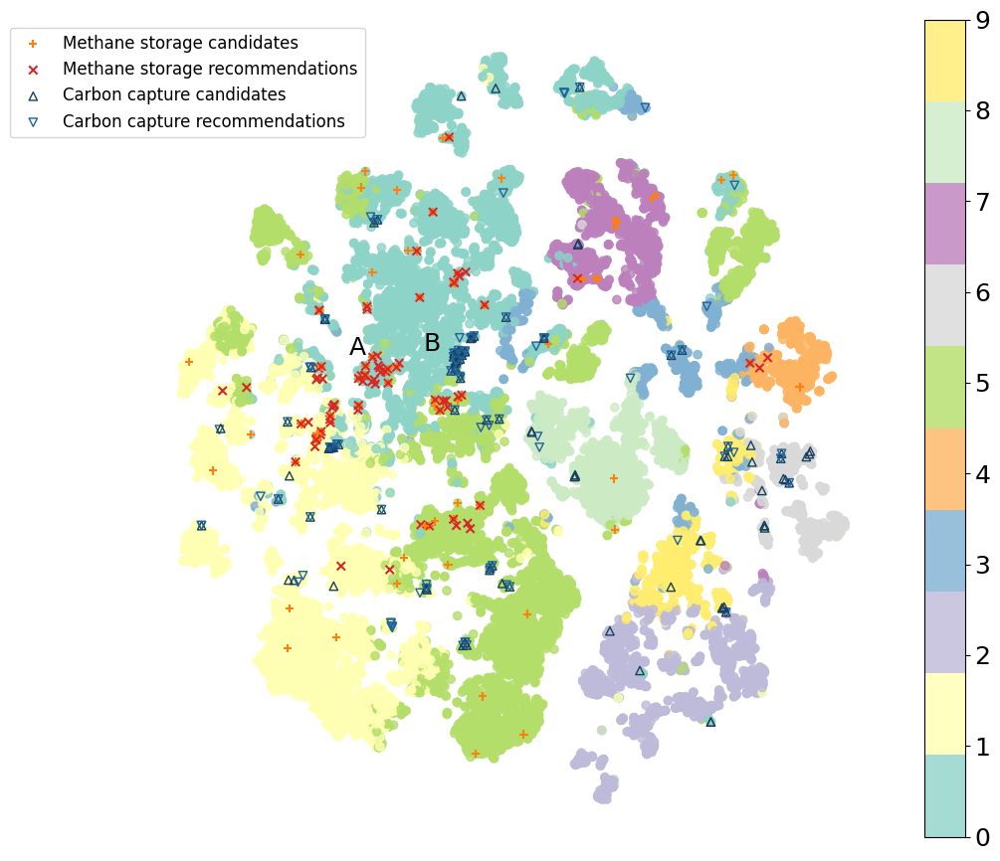

In [69]:
plt.figure(figsize=(11,9))
plt.scatter(emb_2d[:, 0], emb_2d[:, 1], c=classes, cmap=plt.cm.get_cmap('Set3', num_classes), alpha=.8)
plt.colorbar(ticks=range(num_classes))

plt.axis('off')
for i, name in enumerate(all_mofs):
    if name in ch4_best: 
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], marker='+', ec='#ff7f0e', facecolors='none')
    if name in recm_ch4_best:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], marker='x', ec='#d62728', facecolors='none')
    if name in co2_best: #
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], marker='^', ec='#173f5f', facecolors='none')
    if name in recm_co2_best:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], marker='v', ec='#20639b', facecolors='none')

plt.text(-25, 25, "B")
plt.text(-48, 24, "A")


scatters = [
    plt.scatter([], [], marker='+', ec='#ff7f0e', facecolors='none'),
    plt.scatter([], [], marker='x', ec='#d62728', facecolors='none'),
    plt.scatter([], [], marker='^', ec='#173f5f', facecolors='none'),
    plt.scatter([], [], marker='v', ec='#20639b', facecolors='none')
]        
plt.legend(scatters, ['Methane storage candidates', 'Methane storage recommendations', 'Carbon capture candidates', 'Carbon capture recommendations'], prop={'size': 12}, bbox_to_anchor=(-0.2, 1), loc='upper left')
plt.tight_layout()
# plt.savefig("../../../files/figures_oct23/4-tsne_v4.0.png", dpi=600)
        
"""for i, name in enumerate(all_mofs):
    if name in postcom_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='blue', marker='X')
    elif name in precom_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='orange', marker='X')
    elif name in nat_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='green', marker='X')
    elif name in land_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='red', marker='X')
    elif name in methane_rows["info.name"].values:
        plt.scatter(emb_2d[i, 0], emb_2d[i, 1], color='purple', marker='X')"""

In [ ]:
def common_member(a, b):
    result = [i for i in a if i in b]
    return result

In [ ]:
common_ch4 = common_member(ch4_best, recm_ch4_best)
common_co2 = common_member(co2_best, recm_co2_best)

In [ ]:
for i, name in enumerate(all_mofs):
    if name in common_co2: 
        if (emb_2d[i,0] > -25) and (emb_2d[i,0] < 0) and (emb_2d[i,1] > 10):
            print(name)

DB0-m29_o95_o87_f0_pts.sym.71_repeat
DB0-m29_o95_o87_f0_pts.sym.38_repeat
DB0-m29_o95_o87_f0_pts.sym.29_repeat
DB0-m29_o88_o87_f0_pts.sym.90_repeat
DB0-m29_o93_o87_f0_pts.sym.81_repeat
DB0-m29_o95_o87_f0_pts.sym.2_repeat
DB0-m29_o92_o87_f0_pts.sym.56_repeat
DB0-m29_o95_o87_f0_pts.sym.32_repeat
DB0-m29_o95_o87_f0_pts.sym.89_repeat
DB0-m29_o96_o87_f0_pts.sym.42_repeat
DB0-m29_o95_o87_f0_pts.sym.28_repeat
DB0-m29_o95_o87_f0_pts.sym.33_repeat
DB0-m29_o99_o87_f0_pts.sym.83_repeat
DB0-m29_o91_o87_f0_pts.sym.50_repeat
DB0-m29_o89_o87_f0_pts.sym.49_repeat
DB0-m29_o95_o87_f0_pts.sym.88_repeat
DB0-m29_o91_o87_f0_pts.sym.62_repeat
DB0-m29_o88_o87_f0_pts.sym.78_repeat
DB0-m29_o95_o87_f0_pts.sym.45_repeat
DB0-m29_o95_o87_f0_pts.sym.27_repeat
DB0-m29_o97_o87_f0_pts.sym.43_repeat
DB0-m29_o95_o87_f0_pts.sym.63_repeat


In [ ]:
for i, name in enumerate(all_mofs):
    if name in common_co2: 
        if classes[i] == 5:
        # if (emb_2d[i,1] > 10) and (emb_2d[i,1] < 25) and (emb_2d[i,0] > -50) and (emb_2d[i,0] < -25):
            print(name)

DB0-m29_o97_o87_f0_pts.sym.27_repeat
DB0-m29_o95_o87_f0_pts.sym.2_repeat
DB0-m29_o92_o87_f0_pts.sym.22_repeat
DB0-m29_o89_o87_f0_pts.sym.36_repeat
DB0-m29_o97_o87_f0_pts.sym.23_repeat
DB0-m29_o92_o87_f0_pts.sym.30_repeat
DB0-m29_o91_o87_f0_pts.sym.35_repeat
DB0-m29_o93_o87_f0_pts.sym.5_repeat
DB0-m29_o91_o87_f0_pts.sym.38_repeat
DB0-m29_o95_o87_f0_pts.sym.63_repeat
DB0-m29_o89_o87_f0_pts.sym.41_repeat


In [ ]:
for i, name in enumerate(all_mofs):
    if name in common_ch4: 
        if (emb_2d[i,1] > -30) and (emb_2d[i,1] < -10) and (emb_2d[i,0] > -50) and (emb_2d[i,0] < -0):
            print(name)

DB0-m29_o92_o150_f0_pts.sym.2_repeat
DB0-m29_o96_o53_f0_pts.sym.3_repeat
DB0-m29_o97_o54_f0_pts.sym.61_repeat
DB0-m29_o92_o151_f0_pts.sym.56_repeat
DB0-m29_o92_o151_f0_pts.sym.42_repeat


## K-means clusters vs MOF Features

In [42]:
for i in df.keys():
    print(i)

UC_volume
Density
ASA
vASA
gASA
NASA
gNASA
vNASA
AVA
AVAf
AVAg
NAVA
NAVAf
NAVAg
POAVA
POAVAf
POAVAg
NPOAVA
NPOAVAf
NPOAVAg
Di
Df
Dif
ARC-MOF
DB_num
order_geo
bool_geo
cifname_x
filename
Crystalnet
likely topology
cifname_y
info.undecorated_graph_hash
info.undecorated_no_leaf_hash
info.undecorated_scaffold_hash
info.decorated_graph_hash
info.decorated_no_leaf_hash
info.decorated_scaffold_hash
info.name
outputs.postcombustion_vsa_uptake-mmol/g
outputs.postcombustion_vsa_working_capacity-mmol/g
outputs.postcombustion_vsa_v/v-uptake-
outputs.postcombustion_vsa_v/v_working_capacity-
outputs.postcombustion_vsa_wt%_uptake-
outputs.postcombustion_vsa_wt%_working_capacity-
outputs.postcombustion_vsa_selectivity-
outputs.postcombustion_vsa_purity-
outputs.precombustion_40_40_uptake-mmol/g
outputs.precombustion_40_40_working_capacity-mmol/g
outputs.precombustion_40_40_v/v_uptake-
outputs.precombustion_40_40_v/v_working_capacity-
outputs.precombustion_40_40_wt%_uptake-
outputs.precombustion_40_40_

In [54]:
df[['Crystalnet_code']] = df[['Crystalnet']].apply(lambda col:pd.Categorical(col).codes)

In [56]:
topo_code = [df[df['info.name'] == x]['Crystalnet_code'].values[0] for x in all_mofs]

In [99]:
df['binned_density'] = pd.qcut(df['Density'], q=np.arange(0, 1.1, 0.1), labels=range(10))
df['binned_df'] = pd.qcut(df['Df'], q=np.arange(0, 1.1, 0.1), labels=range(10))

In [100]:
densities = [df[df['info.name'] == x]['binned_density'].values[0] for x in all_mofs]
diameter_f = [df[df['info.name'] == x]['binned_df'].values[0] for x in all_mofs]
# ch4_rank = [df[df['info.name'] == x]['xq.ch4_rank'].values[0] for x in all_mofs]
# co2_rank = [df[df['info.name'] == x]['xq.co2_rank'].values[0] for x in all_mofs]

In [109]:
metal = [documents[x][0] for x in all_mofs]
metal_mapping = {metal_type: index for index, metal_type in enumerate(set(metal))}
metal_code = [metal_mapping[metal_type] for metal_type in metal]

In [113]:
Counter(metal)

Counter({'Zn': 2335, 'Cu': 940, 'Fe': 18738, 'Li': 22})

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_99875/1162592451.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  ax[0].scatter(emb_2d[:, 0], emb_2d[:, 1], c=classes, cmap=plt.cm.get_cmap('Set3', num_classes), alpha=.5)
/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_99875/1162592451.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  ax[1].scatter(emb_2d[:, 0], emb_2d[:, 1], c=topo_code, cmap=plt.cm.get_cmap('tab20', np.max(topo_code)), alpha=.5)
/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_99875/1162592451.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will b

Text(0.5, 1.0, 'CH4')

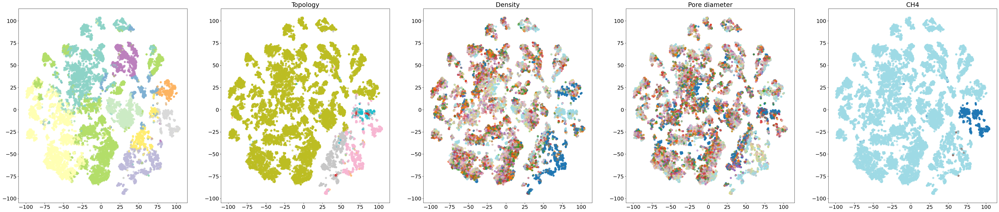

In [112]:
fig, ax = plt.subplots(1, 5, figsize=(60,12))
ax[0].scatter(emb_2d[:, 0], emb_2d[:, 1], c=classes, cmap=plt.cm.get_cmap('Set3', num_classes), alpha=.5)
# ax[0].colorbar(ticks=range(num_classes))

ax[1].scatter(emb_2d[:, 0], emb_2d[:, 1], c=topo_code, cmap=plt.cm.get_cmap('tab20', np.max(topo_code)), alpha=.5)
ax[1].set_title('Topology')

ax[2].scatter(emb_2d[:, 0], emb_2d[:, 1], c=densities, cmap=plt.cm.get_cmap('tab20', 10), alpha=.5)
ax[2].set_title('Density')

ax[3].scatter(emb_2d[:, 0], emb_2d[:, 1], c=diameter_f, cmap=plt.cm.get_cmap('tab20', 10), alpha=.5)
ax[3].set_title('Pore diameter')

ax[4].scatter(emb_2d[:, 0], emb_2d[:, 1], c=metal_code, cmap=plt.cm.get_cmap('tab20', np.max(metal_code)), alpha=.5)
ax[4].set_title('CH4')


# plt.axis('off')

# plt.tight_layout()

# Section 6. Word similarity analysis

In [12]:
topo

array(['bbi', 'cdn', 'cds', 'cdz', 'fsc', 'kto', 'mog', 'mou', 'nbo',
       'pcu', 'pts', 'sqc', 'tbo', 'tfz'], dtype=object)

In [13]:
geom = ['%s_%s' %(x, i) for i in range(10) for x in ['Di', 'Df', 'Dif', 'info.density']]
desc_names = topo.tolist() + geom
desc_vectors = np.array([arc_model.wv[kpi] for kpi in desc_names])

In [14]:
pca = PCA(n_components=40, random_state=2023)
desc_tsne = pca.fit_transform(desc_vectors)
tsne = TSNE(n_components=2, perplexity=3, early_exaggeration=4, random_state=3388, n_jobs=-1)
desc_2d = tsne.fit_transform(desc_tsne)

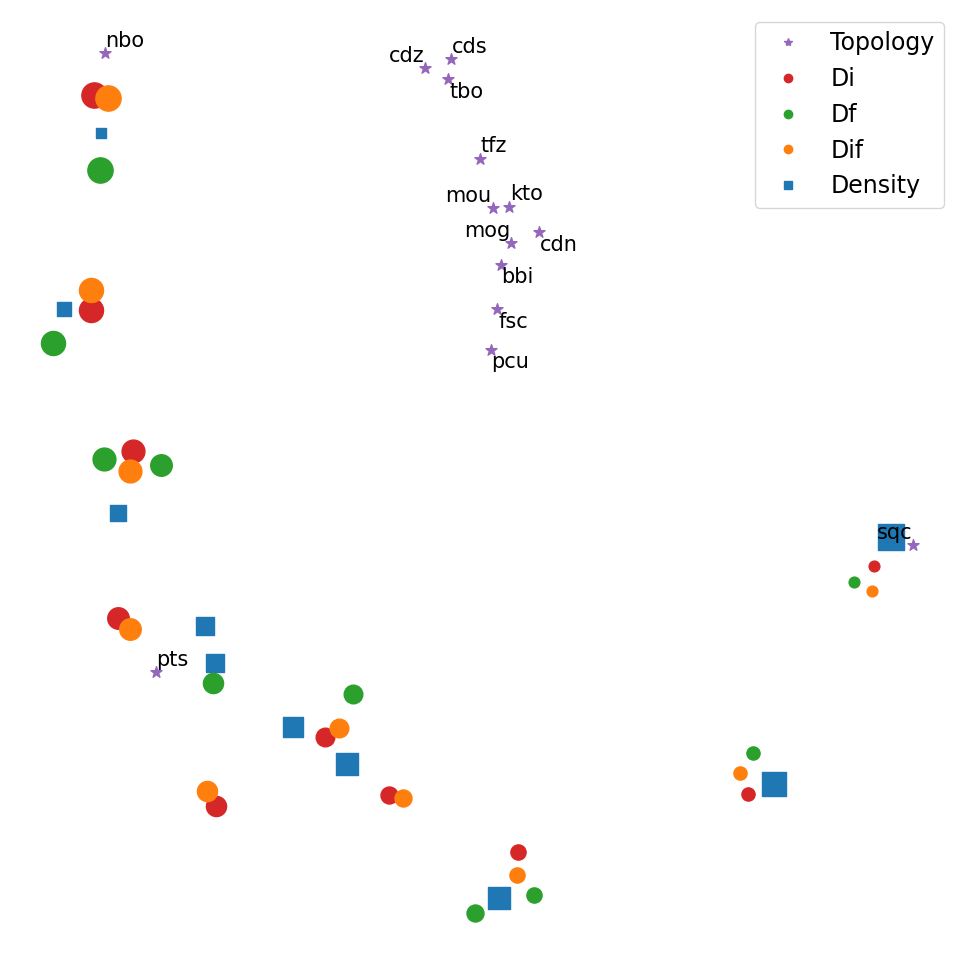

In [ ]:
plt.figure(figsize=(10, 10))

texts = []
for i, name in enumerate(desc_names):
    if name in topo:
        plt.scatter(desc_2d[i,0], desc_2d[i,1], marker='*', c='#9467bd', s=70)
        texts.append(plt.annotate(name, (desc_2d[:,0][i], desc_2d[:,1][i]), fontsize=15))
    else:
        for size in range(10):
            if str(size) in name:
                if "density" in name:
                    plt.scatter(desc_2d[i,0], desc_2d[i,1], s=(size+2)*30, marker='s', c='#1f77b4')
                    #texts.append(plt.annotate(name, (desc_2d[:,0][i], desc_2d[:,1][i]), fontsize=15))
                elif "Dif" in name:
                    plt.scatter(desc_2d[i,0], desc_2d[i,1], s=(size+2)*30, c='#ff7f0e')
                    #texts.append(plt.annotate(name, (desc_2d[:,0][i], desc_2d[:,1][i]), fontsize=15))
                elif "Df" in name:
                    plt.scatter(desc_2d[i,0], desc_2d[i,1], s=(size+2)*30, c='#2ca02c')
                    #texts.append(plt.annotate(name, (desc_2d[:,0][i], desc_2d[:,1][i]), fontsize=15))
                else:
                    plt.scatter(desc_2d[i,0], desc_2d[i,1], s=(size+2)*30, c='#d62728')
                    #texts.append(plt.annotate(name, (desc_2d[:,0][i], desc_2d[:,1][i]), fontsize=15))
    

topo_mk = mlines.Line2D([], [], marker='*', label='Topology', linestyle='None', color='#9467bd')
di_mk = mlines.Line2D([], [], marker='o', label='Di', linestyle='None', color='#d62728')
df_mk = mlines.Line2D([], [], marker='o', label='Df', linestyle='None', color='#2ca02c')
dif_mk = mlines.Line2D([], [], marker='o', label='Dif', linestyle='None', color='#ff7f0e')
density_mk = mlines.Line2D([], [], marker='s', label='Density', linestyle='None', color='#1f77b4')

plt.legend(handles=[topo_mk, di_mk, df_mk, dif_mk, density_mk], loc ="upper right", fontsize=17)
adjust_text(texts) #, arrowprops=dict(arrowstyle='-'))
plt.axis('off')
plt.tight_layout()
# plt.savefig("../../../files/figures_oct23/5-word_similarity.png", dpi=1200)

In [21]:
import seaborn as sns

In [46]:
pair_df = df[['Di', 'Df', 'Dif', 'info.density', 'Crystalnet']]
pair_df.rename(
    columns={
        'Di': r'$D_i  (\AA)$',
        'Df': r'$D_f  (\AA)$',
        'Dif': r'$D_{if}  (\AA)$',
        'info.density': 'Density $(g/cm^3)$',
        'Crystalnet': 'Topology'
    },
    inplace=True
)

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_12283/3303177811.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pair_df.rename(


In [47]:
pair_df

,$D_i (\AA)$,$D_f (\AA)$,$D_{if} (\AA)$,Density $(g/cm^3)$,Topology
0,7.57868,4.51994,7.57868,0.754918,pts
1,11.86670,10.84036,11.76714,0.595504,pts
2,10.90656,8.76373,10.90656,0.575409,pts
3,7.90939,4.07331,7.90939,0.861901,pcu
4,15.04565,9.69810,15.04565,0.435567,nbo
...,...,...,...,...,...
22030,9.21814,6.61085,9.19062,0.692070,pts
22031,7.32998,6.02831,7.32998,0.787505,pts
22032,10.56362,7.55619,10.45383,0.547601,pts
22033,11.18735,7.65851,11.16675,0.622009,pts


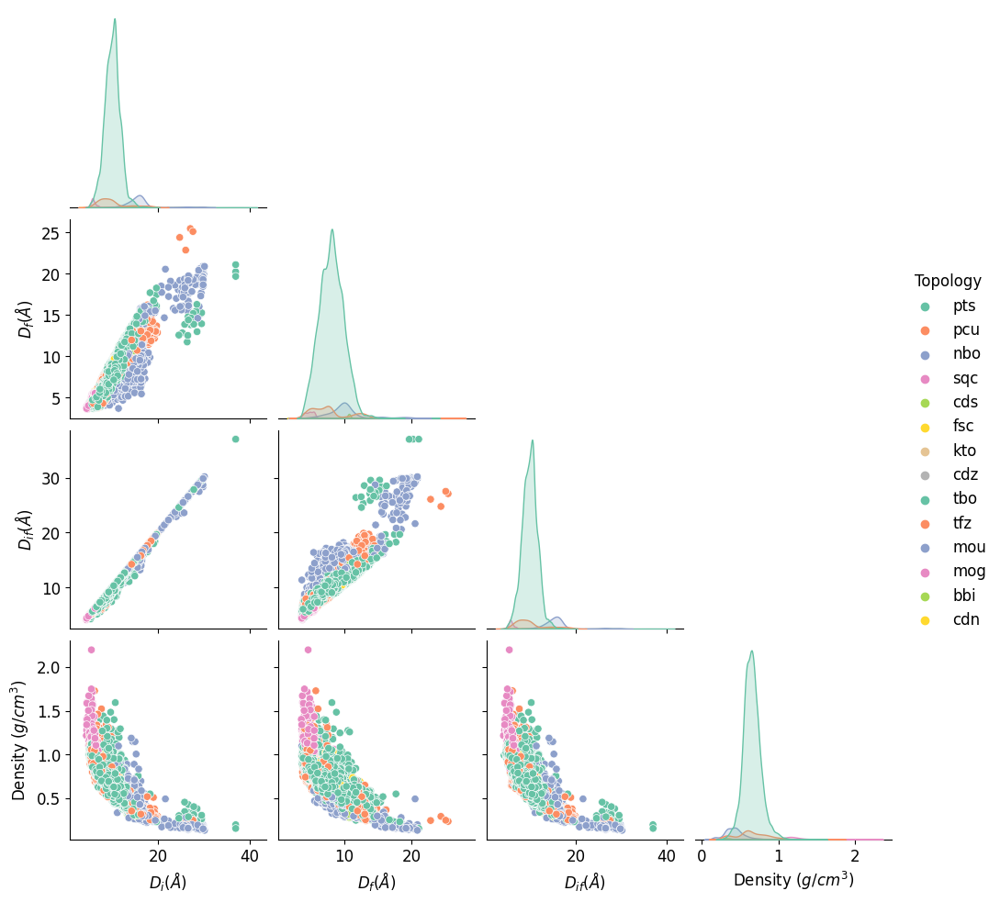

In [53]:
plt.rcParams['font.size'] = 12
plt.rcParams['figure.figsize'] = (20, 20)
sns.pairplot(pair_df, corner=True, hue='Topology', palette='Set2')
plt.savefig("../../../files/figures_oct23/5-word_distribution_v24.01.24.png", dpi=300)

In [58]:
desc_di_names = ['Di_%s' %i for i in range(10)]
di_di_matrix = [
    [1 - arc_core_model.wv.distance(w1=i, w2=j) for j in desc_di_names] for i in desc_di_names
]

desc_rho_names = ['info.density_%s' %i for i in range(10)]
rho_rho_matrix = [
    [1 - arc_core_model.wv.distance(w1=i, w2=j) for j in desc_rho_names] for i in desc_rho_names
]

topo_topo_matrix = [
    [1 - arc_core_model.wv.distance(w1=i, w2=j) for j in topo] for i in topo
]

In [59]:
di_rho_matrix = [
    [1 - arc_core_model.wv.distance(w1=i, w2=j) for j in desc_rho_names] for i in desc_di_names
]

di_topo_matrix = [
    [1 - arc_core_model.wv.distance(w1=i, w2=j) for j in topo] for i in desc_di_names
]

rho_topo_matrix = [
    [1 - arc_core_model.wv.distance(w1=i, w2=j) for j in topo] for i in desc_rho_names
]

In [64]:
len(di_topo_matrix)

10

In [180]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1 import make_axes_locatable

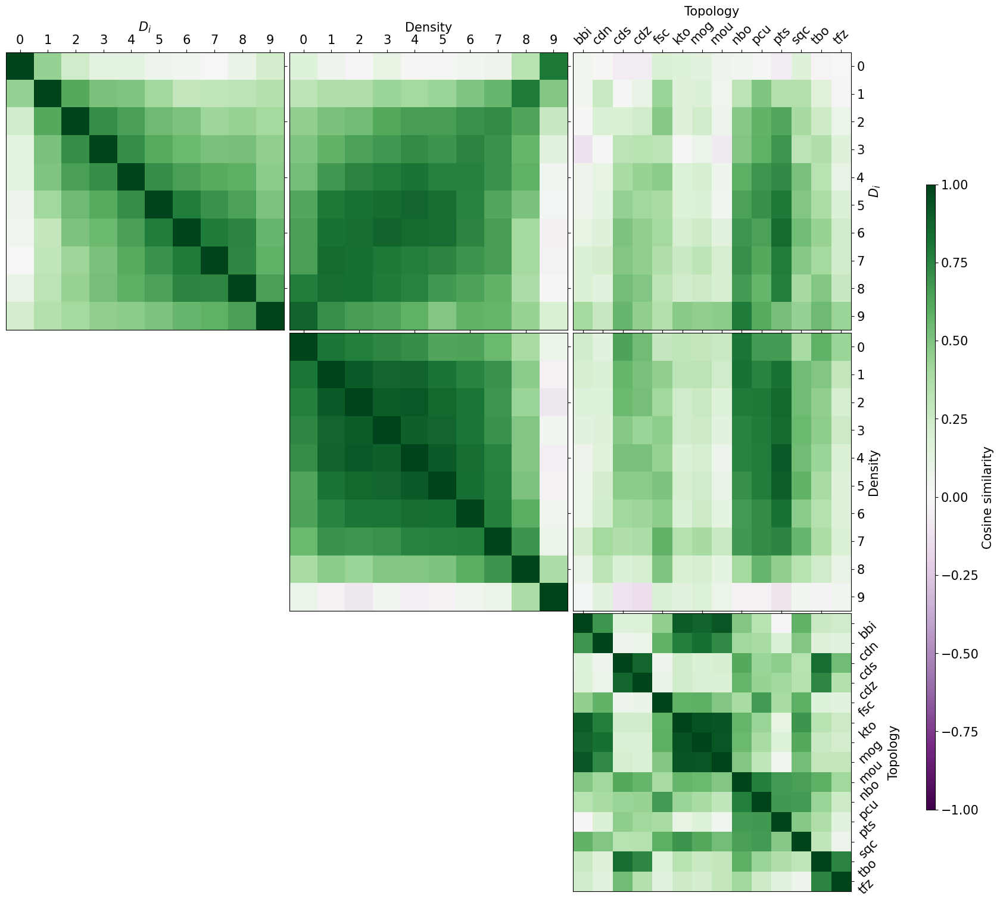

In [203]:
fig, ax = plt.subplots(3, 3)
plt.rcParams['figure.figsize'] = (15, 15)
plt.rcParams['font.size'] = 15

for axx in ax:
    for axy in axx:
        axy.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False, right=True, left=False, labelright=True, labelleft=False)
        axy.xaxis.set_label_position('top')
        axy.yaxis.set_label_position('right')

# ax[0, 0].set_xticks(range(len(desc_di_names)), labels=desc_di_names, rotation=45)
ax[0, 0].set_xlabel('$D_i$')
ax[0, 0].set_xticks(range(len(desc_di_names)), labels=range(len(desc_di_names)))
pcm = ax[0, 0].imshow(di_di_matrix, cmap='PRGn', interpolation='nearest', vmin=-1, vmax=1)
ax[0, 0].yaxis.set_tick_params(labelright=False)

# ax[1, 1].set_xticks(range(len(desc_rho_names)), labels=desc_rho_names, rotation=45)
# ax[1, 1].set_yticks(range(len(desc_rho_names)), labels=desc_rho_names)
ax[1, 1].imshow(rho_rho_matrix, cmap='PRGn', interpolation='nearest', vmin=-1, vmax=1)
ax[1, 1].xaxis.set_tick_params(labeltop=False)
ax[1, 1].yaxis.set_tick_params(labelleft=False, labelright=False)

ax[2, 2].set_ylabel('Topology')
# ax[2, 2].set_xticks(range(len(topo)), labels=topo, rotation=45)
ax[2, 2].set_yticks(range(len(topo)), labels=topo, rotation=45)
ax[2, 2].imshow(topo_topo_matrix, cmap='PRGn', interpolation='nearest', vmin=-1, vmax=1)
ax[2, 2].xaxis.set_tick_params(labeltop=False)
# ax[2, 2].yaxis.set_tick_params(labelright=False)

# ax[0, 1].set_yticks(range(len(desc_di_names)), labels=desc_di_names, rotation=45)
ax[0, 1].set_xticks(range(len(desc_rho_names)), labels=range(len(desc_rho_names)))
ax[0, 1].imshow(di_rho_matrix, cmap='PRGn', interpolation='nearest', vmin=-1, vmax=1)
ax[0, 1].set_xlabel('Density')
ax[0, 1].yaxis.set_tick_params(labelright=False)

ax[0, 2].set_yticks(range(len(desc_di_names)), labels=range(len(desc_di_names)))
ax[0, 2].set_xticks(range(len(topo)), labels=topo, rotation=45)
ax[0, 2].imshow(di_topo_matrix, cmap='PRGn', interpolation='nearest', aspect=1.4, vmin=-1, vmax=1)
ax[0, 2].set_xlabel('Topology')
ax[0, 2].set_ylabel('$D_i$')
# ax[0, 2].yaxis.set_tick_params(labelright=False)

ax[1, 2].set_yticks(range(len(desc_rho_names)), labels=range(len(desc_rho_names)))
ax[1, 2].set_xticks(range(len(topo)), labels=topo, rotation=45)
ax[1, 2].imshow(rho_topo_matrix, cmap='PRGn', interpolation='nearest', aspect=1.4, vmin=-1, vmax=1)
ax[1, 2].set_ylabel('Density')
ax[1, 2].xaxis.set_tick_params(labeltop=False)
# ax[1, 2].yaxis.set_tick_params(labelright=False)

ax[1, 0].set_axis_off()
ax[2, 0].set_axis_off()
ax[2, 1].set_axis_off()


fig.subplots_adjust(right=0.9)
plt.tight_layout(pad=0, w_pad=0, h_pad=0)
cbar_ax = fig.add_axes([1.03, 0.1, 0.01, 0.7])
fig.colorbar(pcm, cax=cbar_ax, label='Cosine similarity')

# fig.colorbar(pcm, ax=ax[1:, 0], location='left', label='Cosine similarity', shrink=1)
plt.savefig("../../../files/figures_oct23/5-heatmap_v24.01.24.png", dpi=300)

# SI

## p-value

In [46]:
def pvalue(mofs, model):
    reference = mofs
    similar_matrix = []
    for i in reference:
        row = []
        for j in reference:
            vec_i = model.dv[i]
            vec_j = model.dv[j]
            row.append(
                cosine(vec_i, vec_j)
            )
        similar_matrix.append(row)
    thresholds = np.arange(-1, 1.05, 0.05)
    p_val = []
    n_reference = len(reference)
    for th in thresholds:
        p = sum(sum(np.array(similar_matrix) >= th)) / (n_reference**2)
        p_val.append(p)
        
    return p_val

In [81]:
ch4_pvalues = []
for ref_mof in [ch4_mof1, ch4_mof2, ch4_mof3, ch4_mof4]:
    pval = pvalue(ref_mof, arc_model)
    ch4_pvalues.append(pval)

In [82]:
co2_pvalues = []
for ref_mof in [co2_mof1, co2_mof2, co2_mof3, co2_mof4]:
    pval = pvalue(ref_mof, arc_model)
    co2_pvalues.append(pval)

In [83]:
qmof_pvalues = []
for ref_mof in [qmof1, qmof2, qmof3, qmof4]:
    pval = pvalue(ref_mof, qmof_model)
    qmof_pvalues.append(pval)

In [84]:
rand_ref = random.choices(df["info.name"].values, k=1000)
arc_pvalues = pvalue(rand_ref, arc_model)

In [85]:
thresholds = np.arange(-1, 1.05, 0.05)

In [ ]:
sns.distplot(ax=ax[2, 0], a=bandgap1, hist=False, label="Initialization")

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_3692/2116645325.py:27: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ax=ax1[0], a=dist, hist=False, color=density_colors[i], kde_kws=dict(linewidth=2), bins=np.arange(-1, 1.1, 0.1))
/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_3692/2116645325.py:27: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, p

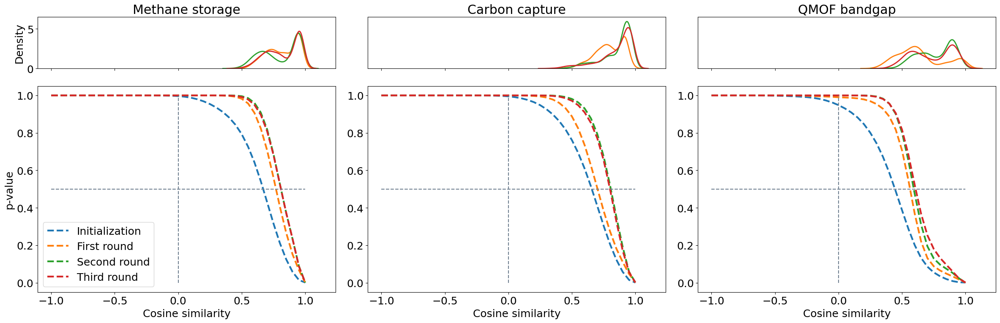

In [181]:
plt.rcParams["figure.figsize"] = (24,8)
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=3, sharex=True, gridspec_kw={'height_ratios': [1, 4]})

ax1[0].set_title("Methane storage")
ax1[1].set_title("Carbon capture")
ax1[2].set_title("QMOF bandgap")

for i in ch4_pvalues:
    ax2[0].plot(thresholds, i, linewidth=3, linestyle='--')

for j in co2_pvalues:
    ax2[1].plot(thresholds, j, linewidth=3, linestyle='--')
    
for q in qmof_pvalues:
    ax2[2].plot(thresholds, q, linewidth=3, linestyle='--')

for ax in ax2:
    ax.plot([-1, 1], [0.5, 0.5], '--', c='slategrey')
    ax.plot([0,0], [0,1], '--', c='slategrey')
    ax.set_xlabel("Cosine similarity")

ax2[0].set_ylabel("p-value")

density_colors = ['#ff7f0e', '#2ca02c', '#d62728']

for i, dist in enumerate([ch4_cos1, ch4_cos2, ch4_cos3]):
    sns.distplot(ax=ax1[0], a=dist, hist=False, color=density_colors[i], kde_kws=dict(linewidth=2), bins=np.arange(-1, 1.1, 0.1))

for i, dist in enumerate([co2_cos1, co2_cos2, co2_cos3]):
    sns.distplot(ax=ax1[1], a=dist, hist=False, color=density_colors[i], kde_kws=dict(linewidth=2), bins=np.arange(-1, 1.1, 0.1))
    
for i, dist in enumerate([qmof_cos1, qmof_cos2, qmof_cos3]):
    sns.distplot(ax=ax1[2], a=dist, hist=False, color=density_colors[i], kde_kws=dict(linewidth=2), bins=np.arange(-1, 1.1, 0.1))
    
for ax in ax1:
    # ax.yaxis.set_visible(False)
    ax.set_ylim([0, 6.5])
    
for ax in ax1[1:]:
    ax.yaxis.set_visible(False)

    
# ax1[0].set_ylabel('Density')
    #ax.axis('off')
    
ini_mk = mlines.Line2D([], [], label='Initialization', linestyle='--', linewidth=3, color='#1f77b4')
first_mk = mlines.Line2D([], [], label='First round', linestyle='--', linewidth=3, color=density_colors[0])
second_mk = mlines.Line2D([], [], label='Second round', linestyle='--', linewidth=3, color=density_colors[1])
third_mk = mlines.Line2D([], [], label='Third round', linestyle='--', linewidth=3, color=density_colors[2])


ax2[0].legend(handles=[ini_mk, first_mk, second_mk, third_mk], loc ="lower left", fontsize=18)
        
plt.subplots_adjust(hspace=0)
plt.tight_layout()

fig.savefig("../../../files/figures_oct23/SI-pvalue-v24.01.22.png", dpi=600)

If such threshold values are generally applicable in the context of similarity searching, i.e., if a similarity value exceeding a threshold value is a rare event and thus indicates significant similarity, they must be largely independent of the selected reference compound.